# We firstly import the data from DIA ETF

In [1]:
pip install pandas-datareader

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas_datareader.data as web
import datetime
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
# we plan to evaluate the 1-month previous data 
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

In [4]:
# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

# Getting data of DIA

In [258]:
from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged


# call the function and generate a table with stock adjusted close prices
stocks = ["UNH", "GS", "HD","MSFT","MCD","AMGN","CAT","V","HON","JNJ","CRM","TRV","CVX","AXP","IBM","AAPL","MMM","BA","PG","WMT","JPM","NKE","DIS","MRK","KO","DOW","VZ","CSCO","WBA","INTC"]
portfolio=combine_stocks(stocks)

                   UNH
Date                  
2018-06-19  238.254471
2018-06-20  238.056717
2018-06-21  237.190384
2018-06-22  239.525696
2018-06-25  236.079300
                    GS
Date                  
2018-06-19  210.568298
2018-06-20  210.107132
2018-06-21  209.332458
2018-06-22  208.447098
2018-06-25  204.315430
                    HD
Date                  
2018-06-19  181.291046
2018-06-20  181.172775
2018-06-21  182.292114
2018-06-22  179.652985
2018-06-25  178.715668
                 MSFT
Date                 
2018-06-19  96.315254
2018-06-20  97.279747
2018-06-21  96.582649
2018-06-22  95.885544
2018-06-25  93.956558
                   MCD
Date                  
2018-06-19  150.083191
2018-06-20  147.890671
2018-06-21  146.043869
2018-06-22  149.701111
2018-06-25  145.388840
                  AMGN
Date                  
2018-06-19  165.470947
2018-06-20  165.755371
2018-06-21  165.293228
2018-06-22  164.546692
2018-06-25  164.733322
                   CAT
Date              

# Mean-Variance Portfolio building

Method 1: We use package for the first trial

In [5]:
pip install PyPortfolioOpt

Note: you may need to restart the kernel to use updated packages.


In [259]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

mu

S

In [260]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [261]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'UNH': 0.0, 'GS': 0.0, 'HD': 0.0, 'MSFT': 0.31332, 'MCD': 0.0, 'AMGN': 0.0, 'CAT': 0.0, 'V': 0.0, 'HON': 0.0, 'JNJ': 0.0, 'CRM': 0.0, 'TRV': 0.0, 'CVX': 0.0, 'AXP': 0.0, 'IBM': 0.0, 'AAPL': 0.33411, 'MMM': 0.0, 'BA': 0.0, 'PG': 0.27968, 'WMT': 0.07289, 'JPM': 0.0, 'NKE': 0.0, 'DIS': 0.0, 'MRK': 0.0, 'KO': 0.0, 'DOW': 0.0, 'VZ': 0.0, 'CSCO': 0.0, 'WBA': 0.0, 'INTC': 0.0}


The optimal portfolio asks us to assign weights of 100% to MRK stock whereas
other stocks occupy 0 weight, indicating one of the weakness of mean-variance portfolio that extremal weights are assigned (weight concentrated on only several stocks).

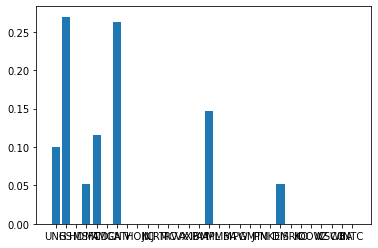

In [227]:
import matplotlib.pyplot as plt
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [262]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 34.4%
Annual volatility: 25.3%
Sharpe Ratio: 1.28


(0.3443369949253976, 0.2532618491369333, 1.2806389751582186)

Comparing our ETF set with DIA, we can find that our expected annual return is 125.2%, much higher than the -9.18% for the DIA in the market. However, our annual volatility is much higher than the market DIA as 32.7% is much higher than 24.12%. And this is probably because of the extremal weights on two stocks within the entire portfolio for our ETF design whereas the market DIA ETF assign weights to 30 stocks. Overall, the Sharpe ratio at 1.08 indicates that our ETF performs better than natural DIA as it's only 0.17 for the market DIA.

Method 2: try to code without using package

In [263]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()

In [264]:
df=df.dropna()

In [7]:
import numpy as np
import pandas as pd
from pandas_datareader import data as web

import scipy.optimize as sco
import scipy.interpolate as sci

Method 2-2: use scipy minimize to write the algorithm; however, constraint for target return hard to edit

In [8]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
# instantiate empty list containers for returns and sd
list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)

NameError: name 'df' is not defined

In [9]:
def sharpe_fun(weights,rf):
  return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))

According to this method, we have UNH assigned with the weight of 19.92%, CAT assigned with the weight of 10.76%, AAPL assigned with the weight of 69.31%, slightly different from method 1 but signaling the same trend of extremal weights.

# Evaluate the performance of the ETF

Method 2-3: use minimize scipy to calculate weights minimizing volatility and use idmax for maximum sharpe ratio 

In [18]:
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [20]:
weight=mini_vol(0.2)
port_ret1= portfolio_returns(weight["x"])
port_std1=portfolio_sd(weight["x"])
rf=0.2
port_sr1=sharpe_fun(weight["x"],rf)
port_ret1
#port_std1
#port_sr1

0.19999999999622456

In [21]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.0313
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

KeyboardInterrupt: 

In [21]:
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.0313 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

Returns         0.842444
Volatility      0.236097
Sharpe Ratio    3.435634
Name: 84324, dtype: float64

In [22]:
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

array([1.06280138e-15, 1.19682004e-16, 1.82364486e-18, 6.62791412e-18,
       4.25012539e-18, 7.72647078e-17, 1.68938669e-15, 0.00000000e+00,
       1.63292441e-18, 1.87954040e-18, 5.25249496e-19, 1.50607876e-18,
       2.00153268e-15, 1.86072808e-18, 4.33522551e-19, 1.87456878e-15,
       5.69891923e-17, 4.42775170e-18, 1.52934709e-18, 2.46482773e-15,
       7.85410220e-16, 5.35130316e-15, 1.93846031e-18, 1.00000000e+00,
       4.60131630e-19, 3.47508361e-16, 9.47234887e-19, 1.46419220e-18,
       5.76796648e-16, 1.14588178e-15])

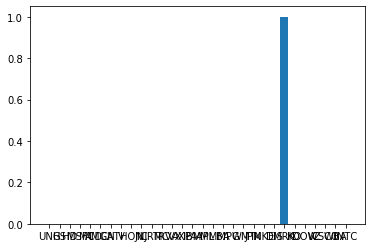

In [23]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(["UNH", "GS", "HD","MSFT","MCD","AMGN","CAT","V","HON","JNJ","CRM","TRV","CVX","AXP","IBM","AAPL","MMM","BA","PG","WMT","JPM","NKE","DIS","MRK","KO","DOW","VZ","CSCO","WBA","INTC"],weight["x"], align='center')
plt.show() 

# Risk-parity portfolio

In [17]:
df.cov()

,UNH,GS,HD,MSFT,MCD,AMGN,CAT,V,HON,JNJ,CRM,TRV,CVX,AXP,IBM,AAPL,MMM,BA,PG,WMT,JPM,NKE,DIS,MRK,KO,DOW,VZ,CSCO,WBA,INTC
UNH,0.000342,0.000310,0.000342,0.000388,0.000243,4.999546e-05,0.000298,0.000370,0.000177,0.000109,0.000438,0.000134,0.000327,0.000369,0.000246,0.000427,0.000164,0.000413,0.000247,1.092840e-04,0.000217,0.000375,0.000222,0.000166,0.000257,0.000168,0.000166,0.000197,0.000349,0.000373
GS,0.000310,0.000477,0.000472,0.000465,0.000231,8.072499e-05,0.000400,0.000442,0.000272,0.000115,0.000550,0.000186,0.000328,0.000454,0.000309,0.000518,0.000282,0.000529,0.000187,-6.751514e-06,0.000376,0.000505,0.000363,0.000125,0.000217,0.000257,0.000257,0.000384,0.000363,0.000504
HD,0.000342,0.000472,0.000702,0.000541,0.000322,7.599816e-05,0.000354,0.000425,0.000359,0.000195,0.000661,0.000219,0.000275,0.000432,0.000396,0.000583,0.000401,0.000343,0.000332,2.248604e-04,0.000357,0.000640,0.000359,0.000190,0.000341,0.000257,0.000223,0.000437,0.000473,0.000572
MSFT,0.000388,0.000465,0.000541,0.000799,0.000294,3.065563e-05,0.000432,0.000677,0.000326,0.000126,0.000823,0.000223,0.000393,0.000564,0.000250,0.000719,0.000264,0.000505,0.000294,8.572145e-05,0.000318,0.000658,0.000498,0.000144,0.000306,0.000241,0.000101,0.000451,0.000378,0.000657
MCD,0.000243,0.000231,0.000322,0.000294,0.000272,2.446240e-05,0.000217,0.000270,0.000204,0.000124,0.000396,0.000138,0.000239,0.000284,0.000244,0.000389,0.000213,0.000251,0.000246,2.389424e-04,0.000205,0.000351,0.000195,0.000169,0.000276,0.000160,0.000128,0.000309,0.000315,0.000320
AMGN,0.000050,0.000081,0.000076,0.000031,0.000024,1.939449e-04,0.000119,0.000014,0.000034,0.000063,-0.000035,0.000079,0.000001,0.000020,0.000115,0.000006,0.000085,0.000024,0.000016,3.867172e-07,0.000065,-0.000030,0.000037,-0.000021,0.000073,0.000067,0.000147,0.000031,0.000129,0.000052
CAT,0.000298,0.000400,0.000354,0.000432,0.000217,1.188015e-04,0.000564,0.000517,0.000313,0.000089,0.000398,0.000199,0.000364,0.000394,0.000340,0.000407,0.000237,0.000470,0.000155,-1.936830e-05,0.000336,0.000488,0.000305,0.000161,0.000233,0.000304,0.000253,0.000324,0.000341,0.000347
V,0.000370,0.000442,0.000425,0.000677,0.000270,1.406173e-05,0.000517,0.000839,0.000280,0.000088,0.000712,0.000221,0.000394,0.000559,0.000302,0.000585,0.000217,0.000432,0.000236,-2.549265e-05,0.000329,0.000691,0.000400,0.000214,0.000295,0.000308,0.000129,0.000410,0.000298,0.000511
HON,0.000177,0.000272,0.000359,0.000326,0.000204,3.404287e-05,0.000313,0.000280,0.000371,0.000110,0.000404,0.000155,0.000188,0.000297,0.000187,0.000420,0.000262,0.000367,0.000153,2.216912e-05,0.000252,0.000469,0.000308,0.000144,0.000167,0.000210,0.000110,0.000367,0.000235,0.000327
JNJ,0.000109,0.000115,0.000195,0.000126,0.000124,6.262873e-05,0.000089,0.000088,0.000110,0.000117,0.000171,0.000103,0.000056,0.000141,0.000144,0.000173,0.000125,0.000097,0.000131,8.640748e-05,0.000109,0.000149,0.000095,0.000092,0.000132,0.000075,0.000064,0.000207,0.000163,0.000168


Method 1: using algorithm

In [268]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=["UNH", "GS", "HD","MSFT","MCD","AMGN","CAT","V","HON","JNJ","CRM","TRV","CVX","AXP","IBM","AAPL","MMM","BA","PG","WMT","JPM","NKE","DIS","MRK","KO","DOW","VZ","CSCO","WBA","INTC"],
                start_date=datetime.datetime(2022,1,1),
                end_date=datetime.datetime(2022,4,19)):

    # We download the prices from Yahoo Finance
    prices = portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = [0.71,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01] 
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

UNH     0.030904
GS      0.022381
HD      0.032933
MSFT    0.032679
MCD     0.040384
AMGN    0.044989
CAT     0.028998
V       0.028663
HON     0.027340
JNJ     0.045424
CRM     0.035328
TRV     0.030743
CVX     0.022867
AXP     0.025336
IBM     0.032415
AAPL    0.031461
MMM     0.040079
BA      0.018681
PG      0.046550
WMT     0.043059
JPM     0.022561
NKE     0.035893
DIS     0.028686
MRK     0.045187
KO      0.044750
DOW     0.024134
VZ      0.042441
CSCO    0.032080
WBA     0.039146
INTC    0.023908
Name: weight, dtype: float64

<BarContainer object of 30 artists>

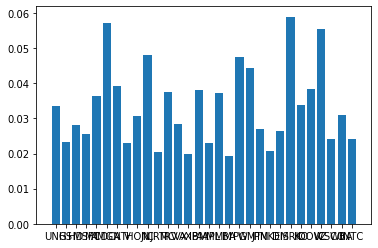

In [100]:
# plot the weights
plt.bar(["UNH", "GS", "HD","MSFT","MCD","AMGN","CAT","V","HON","JNJ","CRM","TRV","CVX","AXP","IBM","AAPL","MMM","BA","PG","WMT","JPM","NKE","DIS","MRK","KO","DOW","VZ","CSCO","WBA","INTC"],get_weights(), align='center')



# Evaluate the performance of ETF

In [269]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

0.1873

In [270]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.2409

In [271]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

0.7774

In [272]:
# consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

0.6475

Comparing our ETF set with DIA, we can find that our expected annual return is 10.71%, still higher than the 4.65% for the DIA in the market. In addition, our annual volatility is also lower than the market DIA as 22.18% is slightly lower than 24.12%. Overall, the Sharpe ratio at 0.4829 also indicates that our ETF performs better than natural DIA as it's only 0.17 for the market DIA.(Notice: even consider the risk-free rate, Sharpe ratio of 0.3488 is also higher than 0.17)

# Evaluation of two models

Evaluation of return table

According to the bar chart, we can see that mean-variance portfolio has higher Sharpe ratio.

# What about other ETFs? Let's try ALTY as another example.

Let's first extrapolate data.

In [484]:
# call the function and generate a table with stock adjusted close prices
stocks = ["PFFD", "SRET", "QYLD","MMP","ED","IEP","EPD","HEP","SPH","SO","ETR","PPL","DUK","D","SUN","MPLX","OGE","EIX"]
portfolio=combine_stocks(stocks)
portfolio

                 PFFD
Date                 
2018-06-19  19.439070
2018-06-20  19.450249
2018-06-21  19.426310
2018-06-22  19.450249
2018-06-25  19.450249
                 SRET
Date                 
2018-06-19  11.061069
2018-06-20  11.119480
2018-06-21  11.116560
2018-06-22  11.170588
2018-06-25  11.148683
                 QYLD
Date                 
2018-06-19  15.393293
2018-06-20  15.474109
2018-06-21  15.404663
2018-06-22  15.398348
2018-06-25  15.177382
                  MMP
Date                 
2018-06-19  50.491074
2018-06-20  50.868618
2018-06-21  49.997341
2018-06-22  50.570927
2018-06-25  49.772243
                   ED
Date                 
2018-06-19  64.423233
2018-06-20  64.569550
2018-06-21  64.931000
2018-06-22  65.197762
2018-06-25  66.626343
                  IEP
Date                 
2018-06-19  42.419235
2018-06-20  42.430981
2018-06-21  41.873219
2018-06-22  42.272465
2018-06-25  42.066975
                  EPD
Date                 
2018-06-19  20.606300
2018-06-20

,PFFD,SRET,QYLD,MMP,ED,IEP,EPD,HEP,SPH,SO,ETR,PPL,DUK,D,SUN,MPLX,OGE,EIX
Date,,,,,,,,,,,,,,,,,,
2018-06-19,19.439070,11.061069,15.393293,50.491074,64.423233,42.419235,20.606300,20.561604,15.964534,37.889198,69.032417,22.125631,64.134689,56.915291,16.955444,22.565260,28.748610,50.753494
2018-06-20,19.450249,11.119480,15.474109,50.868618,64.569550,42.430981,20.731728,20.755970,15.984895,37.880791,69.265450,22.166212,64.575447,56.481647,16.869478,23.008224,28.756933,50.652946
2018-06-21,19.426310,11.116560,15.404663,49.997341,64.931000,41.873219,20.554659,20.672672,15.944166,38.082603,68.911552,22.596394,65.185684,56.626194,16.730606,22.799768,29.007000,50.837292
2018-06-22,19.450249,11.170588,15.398348,50.570927,65.197762,42.272465,20.554659,20.485239,15.957748,38.519852,69.230911,22.937284,65.626427,56.915291,16.651249,22.917025,29.140364,51.700348
2018-06-25,19.450249,11.148683,15.177382,49.772243,66.626343,42.066975,20.001320,19.950724,15.984895,39.184124,69.930031,23.367456,67.024879,57.714508,16.333832,22.272116,29.415430,52.211491
2018-06-26,19.466209,11.134082,15.208945,50.476543,66.677986,42.430981,20.407099,20.207573,15.889870,38.755283,69.826477,23.278177,66.779099,57.425430,16.320608,22.441490,29.207050,52.471249
2018-06-27,19.434290,11.053770,15.032173,49.641548,67.039436,41.920193,20.488256,19.909075,15.930596,38.957092,70.551491,23.310646,67.397797,57.842049,16.545444,22.115782,29.232058,52.714252
2018-06-28,19.402359,11.155254,15.152125,49.612514,67.073837,41.708824,20.333324,19.430090,15.950959,38.965504,70.137207,23.229477,67.152016,58.216156,16.360283,22.096233,29.273729,53.191875
2018-06-29,19.474991,11.174239,15.177382,50.157063,67.108253,41.720570,20.414482,19.617517,15.944166,38.940277,69.731522,23.172663,67.024879,57.969589,16.505766,22.239550,29.348747,53.526039


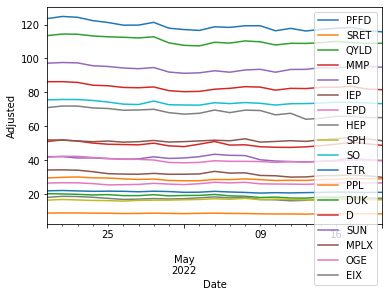

In [32]:
# plot the price within past 3 years
portfolio.plot()
plt.xlabel("Date")
plt.ylabel("Adjusted")
plt.show()

# Mean-Variance building for ALTY

Method 1: We use package for the first trial

In [485]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [486]:
portfolio.head()

,PFFD,SRET,QYLD,MMP,ED,IEP,EPD,HEP,SPH,SO,ETR,PPL,DUK,D,SUN,MPLX,OGE,EIX
Date,,,,,,,,,,,,,,,,,,
2018-06-19,19.439070,11.061069,15.393293,50.491074,64.423233,42.419235,20.606300,20.561604,15.964534,37.889198,69.032417,22.125631,64.134689,56.915291,16.955444,22.565260,28.748610,50.753494
2018-06-20,19.450249,11.119480,15.474109,50.868618,64.569550,42.430981,20.731728,20.755970,15.984895,37.880791,69.265450,22.166212,64.575447,56.481647,16.869478,23.008224,28.756933,50.652946
2018-06-21,19.426310,11.116560,15.404663,49.997341,64.931000,41.873219,20.554659,20.672672,15.944166,38.082603,68.911552,22.596394,65.185684,56.626194,16.730606,22.799768,29.007000,50.837292
2018-06-22,19.450249,11.170588,15.398348,50.570927,65.197762,42.272465,20.554659,20.485239,15.957748,38.519852,69.230911,22.937284,65.626427,56.915291,16.651249,22.917025,29.140364,51.700348
2018-06-25,19.450249,11.148683,15.177382,49.772243,66.626343,42.066975,20.001320,19.950724,15.984895,39.184124,69.930031,23.367456,67.024879,57.714508,16.333832,22.272116,29.415430,52.211491


In [487]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [488]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'PFFD': 0.0, 'SRET': 0.0, 'QYLD': 0.0, 'MMP': 0.0, 'ED': 0.0, 'IEP': 0.0, 'EPD': 0.0, 'HEP': 0.0, 'SPH': 0.0, 'SO': 0.37094, 'ETR': 0.0, 'PPL': 0.0, 'DUK': 0.12701, 'D': 0.0, 'SUN': 0.50205, 'MPLX': 0.0, 'OGE': 0.0, 'EIX': 0.0}


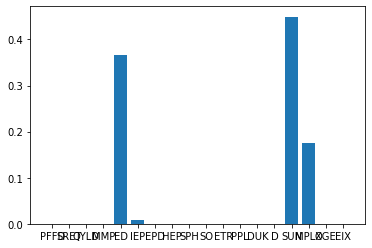

In [427]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

The optimal portfolio asks us to assign weights of 47.137% and 52.86% to SO and SUN stocks respectively whereas
other stocks occupy 0 weight, indicating one of the weakness of mean-variance portfolio that extremal weights are assigned (weight concentrated on only several stocks).

In [489]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 20.9%
Annual volatility: 28.7%
Sharpe Ratio: 0.66


(0.20919254771220652, 0.28689691508462645, 0.6594443431237318)

Comparing our ETF set with ALTY, we can find that our expected annual return is 12.5%, much higher than the -9.01% for the ALTY in the market. However, our annual volatility is higher than the market ALTY as 29.9% is higher than 26.35%. And this is probably because of the extremal weights on two stocks within the entire portfolio for our ETF design whereas the market ALTY ETF assign weights to 18 stocks. Overall, the Sharpe ratio at 0.35 indicates that our ETF performs better than natural ALTY as it's only -0.36 for the market DIA.

Method2: try to code without packages

In [490]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df

,PFFD,SRET,QYLD,MMP,ED,IEP,EPD,HEP,SPH,SO,ETR,PPL,DUK,D,SUN,MPLX,OGE,EIX
Date,,,,,,,,,,,,,,,,,,
2018-06-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-06-20,0.000575,0.005281,5.250034e-03,0.007477,0.002271,0.000277,0.006087,0.009453,0.001275,-0.000222,0.003376,0.001834,0.006872,-0.007619,-0.005070,0.019630,0.000290,-0.001981
2018-06-21,-0.001231,-0.000263,-4.487858e-03,-0.017128,0.005598,-0.013145,-0.008541,-0.004013,-0.002548,0.005328,-0.005109,0.019407,0.009450,0.002559,-0.008232,-0.009060,0.008696,0.003639
2018-06-22,0.001232,0.004860,-4.099558e-04,0.011472,0.004108,0.009535,0.000000,-0.009067,0.000852,0.011482,0.004634,0.015086,0.006761,0.005105,-0.004743,0.005143,0.004598,0.016977
2018-06-25,0.000000,-0.001961,-1.435000e-02,-0.015793,0.021912,-0.004861,-0.026920,-0.026093,0.001701,0.017245,0.010098,0.018754,0.021309,0.014042,-0.019063,-0.028141,0.009439,0.009887
2018-06-26,0.000821,-0.001310,2.079658e-03,0.014150,0.000775,0.008653,0.020288,0.012874,-0.005945,-0.010944,-0.001481,-0.003821,-0.003667,-0.005009,-0.000810,0.007605,-0.007084,0.004975
2018-06-27,-0.001640,-0.007213,-1.162290e-02,-0.016542,0.005421,-0.012038,0.003977,-0.014772,0.002563,0.005207,0.010383,0.001395,0.009265,0.007255,0.013776,-0.014514,0.000856,0.004631
2018-06-28,-0.001643,0.009181,7.979698e-03,-0.000585,0.000513,-0.005042,-0.007562,-0.024059,0.001278,0.000216,-0.005872,-0.003482,-0.003647,0.006468,-0.011191,-0.000884,0.001426,0.009061
2018-06-29,0.003743,0.001702,1.666839e-03,0.010976,0.000513,0.000282,0.003991,0.009646,-0.000426,-0.000647,-0.005784,-0.002446,-0.001893,-0.004235,0.008892,0.006486,0.002563,0.006282


In [491]:
df=df.dropna()

In [492]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
# instantiate empty list containers for returns and sd
list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)

round(min(port_returns), 4)

In [285]:
# User defined Sharpe ratio function
# Negative sign to compute the negative value of Sharpe ratio
def sharpe_fun(weights):
  return - (portfolio_returns(weights) / portfolio_sd(weights))
# We use an anonymous lambda function
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
# This creates 18 tuples of (0, 1), all of which exist within a container tuple
# We essentially create a sequence of (min, max) pairs
bounds = tuple((0, 1) for w in weights)
# Repeat the list with the value (1 / 18) 18 times, and convert list to array
equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
# Minimization results
max_sharpe_results = sco.minimize(
  # Objective function
  fun = sharpe_fun, 
  # Initial guess, which is the equal weight array
  x0 = equal_weights, 
  method = 'SLSQP',
  bounds = bounds, 
  constraints = constraints
)

In [43]:
# Extract the weight composition array which maximize the Sharpe ratio
max_sharpe_results["x"]

array([3.76987746e-15, 2.14292096e-15, 0.00000000e+00, 0.00000000e+00,
       4.73805807e-15, 7.88414105e-16, 1.88710159e-13, 0.00000000e+00,
       1.00000000e+00, 2.13974535e-15, 1.67867424e-15, 1.86930996e-15,
       3.73978091e-15, 1.76587850e-15, 0.00000000e+00, 0.00000000e+00,
       1.06386682e-15, 0.00000000e+00])

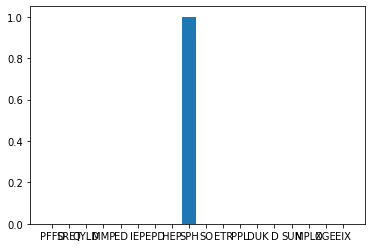

In [44]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(["PFFD", "SRET", "QYLD","MMP","ED","IEP","EPD","HEP","SPH","SO","ETR","PPL","DUK","D","SUN","MPLX","OGE","EIX"],max_sharpe_results["x"], align='center')
plt.show() 

According to this method, we have SO assigned with the weight of 49.82%, SUN assigned with the weight of 35.02%, MPLX assigned with the weight of 15.17%, slightly different from method 1 but signaling the same trend of extremal weights.

# Evaluate the performance of the ETF

Method 2-3

In [45]:
def sharpe_fun(weights,rf):
  return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [46]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.2
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

array([ True,  True,  True, ...,  True,  True,  True])

In [47]:
# find out the portfolio with largest sharpe ratio
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.02 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

Returns         0.200986
Volatility      0.350945
Sharpe Ratio    0.002809
Name: 20149, dtype: float64

In [48]:
# calculat the weight of largest sharoe ratio
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

array([7.93360336e-19, 8.62997524e-20, 3.98243781e-18, 7.77596315e-16,
       2.24272673e-15, 5.39356229e-19, 4.60054806e-16, 2.64467549e-15,
       1.00000000e+00, 2.50571514e-15, 2.60991916e-15, 2.28723775e-19,
       1.58919560e-15, 1.56088096e-18, 0.00000000e+00, 3.69334437e-19,
       6.58032760e-19, 3.35417587e-15])

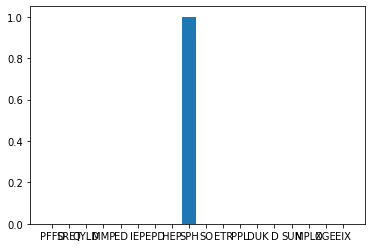

In [50]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(["PFFD", "SRET", "QYLD","MMP","ED","IEP","EPD","HEP","SPH","SO","ETR","PPL","DUK","D","SUN","MPLX","OGE","EIX"],weight["x"], align='center')
plt.show() 

# Risk-parity portfolio

In [51]:
df.cov()

,PFFD,SRET,QYLD,MMP,ED,IEP,EPD,HEP,SPH,SO,ETR,PPL,DUK,D,SUN,MPLX,OGE,EIX
PFFD,0.000150,0.000101,0.000188,0.000171,0.000035,0.000068,0.000119,0.000158,0.000110,0.000065,0.000045,0.000072,0.000056,0.000036,0.000141,0.000151,0.000058,0.000049
SRET,0.000101,0.000208,0.000269,0.000218,0.000091,0.000144,0.000165,0.000265,0.000148,0.000094,0.000108,0.000125,0.000068,0.000097,0.000242,0.000186,0.000116,0.000157
QYLD,0.000188,0.000269,0.000602,0.000346,0.000103,0.000252,0.000221,0.000423,0.000263,0.000138,0.000123,0.000167,0.000071,0.000111,0.000405,0.000372,0.000142,0.000134
MMP,0.000171,0.000218,0.000346,0.000414,0.000149,0.000195,0.000281,0.000411,0.000256,0.000164,0.000156,0.000193,0.000129,0.000133,0.000347,0.000356,0.000189,0.000211
ED,0.000035,0.000091,0.000103,0.000149,0.000134,0.000078,0.000099,0.000116,0.000029,0.000108,0.000125,0.000129,0.000101,0.000118,0.000104,0.000104,0.000125,0.000151
IEP,0.000068,0.000144,0.000252,0.000195,0.000078,0.000220,0.000151,0.000261,0.000228,0.000095,0.000092,0.000120,0.000063,0.000095,0.000247,0.000203,0.000084,0.000127
EPD,0.000119,0.000165,0.000221,0.000281,0.000099,0.000151,0.000271,0.000357,0.000225,0.000134,0.000122,0.000152,0.000106,0.000104,0.000289,0.000304,0.000130,0.000178
HEP,0.000158,0.000265,0.000423,0.000411,0.000116,0.000261,0.000357,0.000851,0.000373,0.000172,0.000127,0.000244,0.000110,0.000103,0.000435,0.000531,0.000175,0.000177
SPH,0.000110,0.000148,0.000263,0.000256,0.000029,0.000228,0.000225,0.000373,0.000487,0.000088,0.000090,0.000107,0.000057,0.000067,0.000296,0.000273,0.000091,0.000186
SO,0.000065,0.000094,0.000138,0.000164,0.000108,0.000095,0.000134,0.000172,0.000088,0.000148,0.000129,0.000130,0.000107,0.000107,0.000152,0.000151,0.000103,0.000145


Method1: using algorithm

In [493]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=["PFFD", "SRET", "QYLD","MMP","ED","IEP","EPD","HEP","SPH","SO","ETR","PPL","DUK","D","SUN","MPLX","OGE","EIX"],
                start_date=datetime.datetime(2022,3,19),
                end_date=datetime.datetime(2022,5,19)):

    # We download the prices from Yahoo Finance
    prices = portfolio
    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = [0.83,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01] 
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

PFFD    0.100112
SRET    0.036122
QYLD    0.083637
MMP     0.044174
ED      0.062296
IEP     0.059611
EPD     0.045387
HEP     0.049914
SPH     0.049681
SO      0.059747
ETR     0.052204
PPL     0.048369
DUK     0.061163
D       0.064559
SUN     0.038388
MPLX    0.046855
OGE     0.052131
EIX     0.045649
Name: weight, dtype: float64

<BarContainer object of 18 artists>

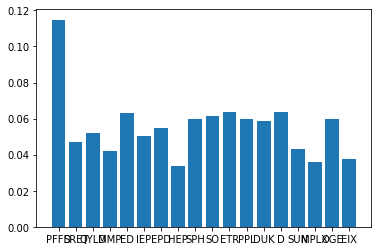

In [317]:
# plot the weights
plt.bar(["PFFD", "SRET", "QYLD","MMP","ED","IEP","EPD","HEP","SPH","SO","ETR","PPL","DUK","D","SUN","MPLX","OGE","EIX"],get_weights(), align='center')

# Evaluate the performance of ETF

In [494]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
max_sharpe_port_return

0.11249993993787702

In [495]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.2161

In [496]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

0.5206

In [466]:
# Sharpe ratio
# Consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

1.4748

Comparing our ETF set with ALTY, we can find that our expected annual return is 5.57%, still higher than the -9.01% for the ALTY in the market. In addition, our annual volatility is also lower than the market ALTY as 22.05% is slightly lower than 26.35%. Overall, the Sharpe ratio at 0.2527 also indicates that our ETF performs better than natural DIA as it's only -0.36 for the market ALTY.

# Evaluation of 2 models

Evaluation of return table

According to the bar chart, we can see that mean-variance portfolio has higher Sharpe ratio.

# What about UYM as another example?

Let's first extrapolate data.

In [337]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

In [338]:
# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

In [339]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged




In [340]:
# call the function and generate a table with stock adjusted close prices
stocks = ["LIN", "APD", "NEM","FCX","DOW","CTVA","ECL","NUE","DD","IFF","PPG","LYB","ALB","CF","MOS","CE","STLD","FMC","EMN", "RS", "RPM","AA","CLF","RGLD","OLN","HUN","X","VVV","CC","ASH","CMC","ESI","WLK","SMG","DNA","NGVT","MP","NEU"]
portfolio=combine_stocks(stocks)
portfolio

                   LIN
Date                  
2018-06-19  145.058228
2018-06-20  144.787369
2018-06-21  145.581253
2018-06-22  147.701431
2018-06-25  144.581924
                   APD
Date                  
2018-06-19  144.647675
2018-06-20  142.861679
2018-06-21  141.855347
2018-06-22  143.314987
2018-06-25  141.211670
                  NEM
Date                 
2018-06-19  34.073383
2018-06-20  33.717983
2018-06-21  32.891701
2018-06-22  33.282631
2018-06-25  32.865055
                  FCX
Date                 
2018-06-19  15.511892
2018-06-20  15.550053
2018-06-21  15.607291
2018-06-22  15.683612
2018-06-25  15.015818
                  DOW
Date                 
2019-03-20  41.921722
2019-03-21  41.231453
2019-03-22  40.911568
2019-03-25  41.374565
2019-03-26  41.122025
                 CTVA
Date                 
2019-05-24  27.709457
2019-05-28  27.484909
2019-05-29  27.231705
2019-05-30  27.518356
2019-05-31  25.769791
                   ECL
Date                  
2018-06-19  138.

,LIN,APD,NEM,FCX,DOW,CTVA,ECL,NUE,DD,IFF,PPG,LYB,ALB,CF,MOS,CE,STLD,FMC,EMN,RS,RPM,AA,CLF,RGLD,OLN,HUN,X,VVV,CC,ASH,CMC,ESI,WLK,SMG,DNA,NGVT,MP,NEU
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,145.058228,144.647675,34.073383,15.511892,NaN,NaN,138.873871,58.458858,87.276840,113.199348,97.371902,87.679367,86.424294,40.537407,27.345499,102.353401,41.664024,69.386246,91.748680,84.388733,46.403477,44.248161,8.039430,87.945290,25.308540,27.781080,34.155235,19.018911,39.676441,74.271713,21.196758,11.600721,99.609558,73.978668,NaN,82.720001,NaN,365.459106
2018-06-20,144.787369,142.861679,33.717983,15.550053,NaN,NaN,137.971008,58.824955,86.658684,113.389023,98.316360,86.694199,86.622849,39.981361,26.843220,102.161713,42.085323,69.845070,90.718361,85.554184,47.183914,45.044167,8.209877,87.649498,25.230160,27.870272,34.718826,19.704447,39.609188,74.158066,21.588953,11.571378,99.024780,71.408531,NaN,83.040001,NaN,367.273468
2018-06-21,145.581253,141.855347,32.891701,15.607291,NaN,NaN,135.963654,57.923115,85.856422,112.621185,97.530876,85.133736,86.963280,40.277321,27.413115,101.595749,41.690914,69.700195,88.895554,84.388733,47.211456,44.586464,8.143593,86.208717,25.282415,27.237057,34.398155,19.472849,39.180485,73.532974,20.312042,11.326843,99.854790,72.966736,NaN,82.919998,NaN,366.140594
2018-06-22,147.701431,143.314987,33.282631,15.683612,NaN,NaN,133.379974,59.110680,88.118576,113.184387,98.578178,87.498085,88.372154,40.627087,27.896080,104.060341,42.936890,71.591797,89.899429,85.682648,47.569538,45.332722,8.522363,88.536903,25.456593,27.415426,35.865421,19.732243,39.508320,74.356972,21.306210,11.473563,101.731712,73.432396,NaN,81.089996,NaN,368.452484
2018-06-25,144.581924,141.211670,32.865055,15.015818,NaN,NaN,132.947754,56.664104,86.777069,112.312325,98.288300,84.818451,86.953819,39.452225,27.171629,101.422325,41.699879,71.157127,88.331963,82.590103,47.422638,44.039204,7.954206,87.458672,25.238867,26.791132,33.543060,19.361681,39.399036,73.390915,20.138742,11.189902,99.449196,72.635384,NaN,80.070000,NaN,365.956390
2018-06-26,144.012161,141.302292,33.024971,15.502353,NaN,NaN,132.947754,57.253433,87.211082,111.912651,98.961563,85.354378,87.483330,39.550873,27.094355,101.404068,42.040504,71.116882,88.261528,83.003052,48.184700,45.571526,8.077306,87.811714,24.942759,26.746538,34.330135,19.565491,37.869144,73.845528,20.156988,11.375751,99.166252,72.841370,NaN,81.320000,NaN,367.328827
2018-06-27,145.273041,140.667725,32.856167,16.122450,NaN,NaN,132.861328,56.244431,86.290428,111.839996,98.288300,85.937599,88.324867,39.299759,27.113678,100.655548,41.000698,71.334221,87.292870,81.461372,48.955940,45.511826,7.916330,87.535019,24.611816,26.095490,33.494480,19.658125,37.112598,72.955246,19.326994,11.248591,100.024544,72.653313,NaN,80.250000,NaN,366.223511
2018-06-28,146.337799,141.456467,32.873932,16.017511,NaN,NaN,134.542130,56.325283,87.000633,112.366844,98.858711,86.181915,88.542351,39.721283,27.345499,101.038948,41.304928,71.217293,87.794807,80.562057,53.335545,46.238182,7.925799,87.172440,24.698908,26.095490,33.669388,19.713715,36.978100,73.949699,19.336115,10.984494,100.496147,73.817490,NaN,81.220001,NaN,369.014282
2018-06-29,147.710754,142.186874,33.504749,16.465885,NaN,NaN,134.782257,56.145626,86.698166,112.603004,96.997864,86.575981,89.194794,39.819939,27.094355,101.376678,41.358932,71.943085,88.023766,80.332642,53.546715,46.646133,7.982615,88.584579,25.012434,26.041983,33.766556,19.982363,37.289124,74.044403,19.254026,11.346407,101.514778,74.471207,NaN,80.860001,NaN,372.560272


In [ ]:
# plot the price within past 1 year
import matplotlib.pyplot as plt
portfolio.plot()
plt.xlabel("Date")
plt.ylabel("Adjusted")
plt.show()

# Mean-Variance Portfolio building

Method 1: We use package for the first trial

In [341]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [342]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [343]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'LIN': 0.09626, 'APD': 0.02441, 'NEM': 0.08193, 'FCX': 0.0, 'DOW': 0.0, 'CTVA': 0.0, 'ECL': 0.0, 'NUE': 0.0, 'DD': 0.0, 'IFF': 0.0, 'PPG': 0.0, 'LYB': 0.0, 'ALB': 0.0, 'CF': 0.0, 'MOS': 0.0, 'CE': 0.0, 'STLD': 0.0, 'FMC': 0.0, 'EMN': 0.0, 'RS': 0.0, 'RPM': 0.04612, 'AA': 0.0, 'CLF': 0.0, 'RGLD': 0.0, 'OLN': 0.0, 'HUN': 0.0, 'X': 0.0, 'VVV': 0.0, 'CC': 0.0, 'ASH': 0.0, 'CMC': 0.0, 'ESI': 0.0, 'WLK': 0.0, 'SMG': 0.01987, 'DNA': 0.0, 'NGVT': 0.0, 'MP': 0.73142, 'NEU': 0.0}


The optimal portfolio asks us to assign weights of 10.847%, 7.664%, 60.537% and 20.207% to NEM, CTVA, CF and SLVM stocks respectively whereas other stocks occupy 0 weight, indicating one of the weakness of mean-variance portfolio that extremal weights are assigned (weight concentrated on only several stocks).

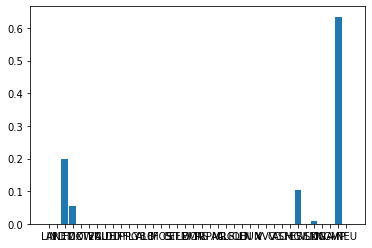

In [327]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [344]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 160.7%
Annual volatility: 37.1%
Sharpe Ratio: 4.28


(1.6068836595018974, 0.37107520677396777, 4.276447551691354)

Comparing our ETF set with UYM, we can find that our expected annual return is 95.2%, much higher than the -78.21% for the UYM in the market. In addition, our annual volatility is much lower than the market UYM as 34.2% is much lower than 87.16%. And this is probably because this market ETF contains stocks that were newly introduced to the market. Overall, the Sharpe ratio at 2.73 indicates that our ETF performs better than natural UYM as it's only -0.99 for the market UYM.

Method 2: try to code without using package

In [345]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df

,LIN,APD,NEM,FCX,DOW,CTVA,ECL,NUE,DD,IFF,PPG,LYB,ALB,CF,MOS,CE,STLD,FMC,EMN,RS,RPM,AA,CLF,RGLD,OLN,HUN,X,VVV,CC,ASH,CMC,ESI,WLK,SMG,DNA,NGVT,MP,NEU
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-06-20,-0.001867,-0.012347,-0.010430,0.002460,NaN,NaN,-0.006501,0.006262,-0.007083,0.001676,0.009699,-0.011236,0.002297,-0.013717,-0.018368,-0.001873,0.010112,0.006613,-0.011230,0.013811,0.016819,0.017990,0.021201,-0.003363,-0.003097,0.003211,0.016501,0.036045,-0.001695,-0.001530,0.018503,-0.002529,-0.005871,-0.034742,NaN,0.003868,NaN,0.004965
2018-06-21,0.005483,-0.007044,-0.024506,0.003681,NaN,NaN,-0.014549,-0.015331,-0.009258,-0.006772,-0.007989,-0.018000,0.003930,0.007402,0.021230,-0.005540,-0.009372,-0.002074,-0.020093,-0.013622,0.000584,-0.010161,-0.008074,-0.016438,0.002071,-0.022720,-0.009236,-0.011754,-0.010823,-0.008429,-0.059146,-0.021133,0.008382,0.021821,NaN,-0.001445,NaN,-0.003085
2018-06-22,0.014564,0.010290,0.011885,0.004890,NaN,NaN,-0.019003,0.020502,0.026348,0.005001,0.010738,0.027772,0.016201,0.008684,0.017618,0.024259,0.029886,0.027139,0.011293,0.015333,0.007585,0.016737,0.046511,0.027006,0.006889,0.006549,0.042655,0.013321,0.008367,0.011206,0.048945,0.012953,0.018797,0.006382,NaN,-0.022069,NaN,0.006314
2018-06-25,-0.021120,-0.014676,-0.012546,-0.042579,NaN,NaN,-0.003241,-0.041390,-0.015224,-0.007705,-0.002941,-0.030625,-0.016050,-0.028918,-0.025970,-0.025351,-0.028810,-0.006071,-0.017436,-0.036093,-0.003088,-0.028534,-0.066667,-0.012178,-0.008553,-0.022772,-0.064752,-0.018779,-0.002766,-0.012992,-0.054795,-0.024723,-0.022437,-0.010854,NaN,-0.012579,NaN,-0.006775
2018-06-26,-0.003941,0.000642,0.004866,0.032402,NaN,NaN,0.000000,0.010400,0.005001,-0.003559,0.006850,0.006319,0.006090,0.002500,-0.002844,-0.000180,0.008169,-0.000566,-0.000797,0.005000,0.016070,0.034794,0.015476,0.004037,-0.011732,-0.001664,0.023465,0.010526,-0.038831,0.006194,0.000906,0.016609,-0.002845,0.002836,NaN,0.015611,NaN,0.003750
2018-06-27,0.008755,-0.004491,-0.005111,0.040000,NaN,NaN,-0.000650,-0.017623,-0.010557,-0.000649,-0.006803,0.006833,0.009619,-0.006349,0.000713,-0.007382,-0.024733,0.003056,-0.010975,-0.018574,0.016006,-0.001310,-0.019929,-0.003151,-0.013268,-0.024341,-0.024342,0.004735,-0.019978,-0.012056,-0.041176,-0.011178,0.008655,-0.002582,NaN,-0.013158,NaN,-0.003009
2018-06-28,0.007329,0.005607,0.000541,-0.006509,NaN,NaN,0.012651,0.001438,0.008230,0.004711,0.005803,0.002843,0.002462,0.010726,0.008550,0.003809,0.007420,-0.001639,0.005750,-0.011040,0.089460,0.015960,0.001196,-0.004142,0.003539,0.000000,0.005222,0.002828,-0.003624,0.013631,0.000472,-0.023478,0.004715,0.016024,NaN,0.012087,NaN,0.007620
2018-06-29,0.009382,0.005163,0.019189,0.027993,NaN,NaN,0.001785,-0.003190,-0.003477,0.002102,-0.018823,0.004572,0.007369,0.002484,-0.009184,0.003343,0.001307,0.010191,0.002608,-0.002848,0.003959,0.008823,0.007168,0.016199,0.012694,-0.002050,0.002886,0.013627,0.008411,0.001281,-0.004245,0.032948,0.010136,0.008856,NaN,-0.004432,NaN,0.009609


In [346]:
df=df.dropna()

In [347]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
# instantiate empty list containers for returns and sd
list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)

In [312]:
# User defined Sharpe ratio function
# Negative sign to compute the negative value of Sharpe ratio
def sharpe_fun(weights):
  return - (portfolio_returns(weights) / portfolio_sd(weights))
# We use an anonymous lambda function
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
# This creates 12 tuples of (0, 1), all of which exist within a container tuple
# We essentially create a sequence of (min, max) pairs
bounds = tuple((0, 1) for w in weights)
# Repeat the list with the value (1 / 12) 12 times, and convert list to array
equal_weights = np.array([1 / len(df.columns)] * len(df.columns))

In [287]:
# Minimization results
max_sharpe_results = sco.minimize(
  # Objective function
  fun = sharpe_fun, 
  # Initial guess, which is the equal weight array
  x0 = equal_weights, 
  method = 'SLSQP',
  bounds = bounds, 
  constraints = constraints
)

In [288]:
# Extract the weight composition array which maximize the Sharpe ratio
max_sharpe_results["x"]

array([2.46472418e-14, 5.48737179e-15, 3.14651960e-01, 1.55586227e-14,
       5.28459406e-15, 3.28148658e-02, 1.50370848e-14, 2.47222318e-14,
       8.58345928e-15, 1.17155021e-14, 5.51068094e-15, 4.43248165e-15,
       6.80285640e-15, 1.96570394e-01, 3.75109947e-15, 7.63206897e-15,
       1.10728271e-14, 7.89345663e-02, 9.57178238e-15, 6.51960285e-15,
       1.80727414e-14, 1.39082777e-02, 1.85400540e-14, 8.01060255e-02,
       1.39533701e-14, 1.97469265e-01, 2.49649309e-02, 9.30655910e-15,
       2.93771743e-14, 2.10117003e-14, 1.14059263e-14, 1.16260355e-14,
       7.35103923e-15, 2.27466452e-14, 7.11840298e-14, 8.75358060e-15,
       4.63734098e-02, 9.49911401e-15, 1.42063046e-02])

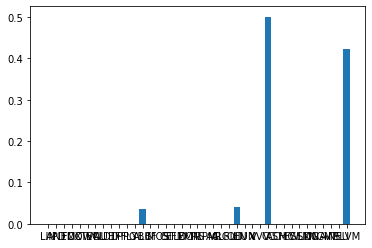

In [51]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(["LIN", "APD", "NEM","FCX","DOW","CTVA","ECL","NUE","DD","IFF","PPG","LYB","ALB","CF","MOS","CE","STLD","FMC","EMN", "RS", "RPM","AA","CLF","RGLD","OLN","HUN","X","VVV","CC","ASH","CMC","ESI","WLK","SMG","DNA","NGVT","MP","NEU","SLVM"],max_sharpe_results["x"], align='center')
plt.show() 

According to this method, we have NEM assigned with the weight of 26.58%, CTVA assigned with the weight of 11.013%, CF assigned with the weight of 36.28%, CC assigned with the weight of 6.27%, SLVM assigned with the weight of 19.86%, slightly different from method 1 but signaling the same trend of extremal weights.

# Evaluate the performance of the ETF

In [75]:
# Expected return
max_sharpe_port_return = portfolio_returns(max_sharpe_results["x"])
round(max_sharpe_port_return, 4)

2.5751

In [76]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(max_sharpe_results["x"])
round(max_sharpe_port_sd, 4)

0.5385

In [77]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

4.7818

In [78]:
# Sharpe ratio
# Consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

4.7237

Comparing our ETF set with UYM, we can find that our expected annual return is 59.14%, much higher than the -78.21% for the UYM in the market. In addition, our annual volatility is much lower than the market UYM as 27.92% is much lower than 87.16%. And this is probably because this market ETF contains stocks that were newly introduced to the market. Overall, the Sharpe ratio at 2.1184 (2.0353 when there's risk-free rate) indicates that our ETF performs better than natural UYM as it's only -0.99 for the market UYM.

Method 2-3

In [79]:
def sharpe_fun(weights,rf):
  return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [80]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.2
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

array([ True,  True,  True, ...,  True,  True,  True])

In [81]:
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.02 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

Returns         0.999990
Volatility      0.284836
Sharpe Ratio    2.808597
Name: 99999, dtype: float64

In [82]:
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

array([0.00000000e+00, 0.00000000e+00, 1.01395654e-16, 0.00000000e+00,
       3.98925539e-01, 0.00000000e+00, 0.00000000e+00, 3.96370789e-16,
       0.00000000e+00, 8.24403946e-02, 7.60522848e-17, 2.06652459e-17,
       0.00000000e+00, 4.83697312e-17, 0.00000000e+00, 6.75778726e-17,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 2.57701155e-16, 0.00000000e+00,
       1.27907745e-02, 2.41062586e-16, 1.22145653e-16, 1.41177937e-16,
       3.57397156e-02, 9.67905280e-18, 6.40450508e-17, 0.00000000e+00,
       3.90360727e-18, 7.60923449e-17, 5.02257405e-16, 2.91705874e-01,
       0.00000000e+00, 0.00000000e+00, 1.78397702e-01])

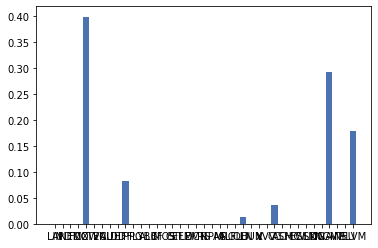

In [84]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(["LIN", "APD", "NEM","FCX","DOW","CTVA","ECL","NUE","DD","IFF","PPG","LYB","ALB","CF","MOS","CE","STLD","FMC","EMN", "RS", "RPM","AA","CLF","RGLD","OLN","HUN","X","VVV","CC","ASH","CMC","ESI","WLK","SMG","DNA","NGVT","MP","NEU","SLVM"],weight["x"], align='center')

plt.show()

# Risk-parity portfolio

In [85]:
df.cov()

,LIN,APD,NEM,FCX,DOW,CTVA,ECL,NUE,DD,IFF,PPG,LYB,ALB,CF,MOS,CE,STLD,FMC,EMN,RS,RPM,AA,CLF,RGLD,OLN,HUN,X,VVV,CC,ASH,CMC,ESI,WLK,SMG,DNA,NGVT,MP,NEU,SLVM
LIN,0.000465,0.000348,0.000229,0.000635,0.000259,0.000364,0.000422,0.000508,0.000419,0.000296,0.000298,0.000360,0.000452,0.000412,0.000483,0.000458,0.000459,0.000260,0.000377,0.000435,0.000287,0.000781,0.000541,0.000247,0.000376,0.000307,0.000451,0.000454,0.000554,0.000367,0.000547,0.000478,0.000377,0.000656,0.000889,0.000249,0.000557,0.000337,0.000383
APD,0.000348,0.000392,0.000144,0.000471,0.000303,0.000251,0.000399,0.000530,0.000366,0.000289,0.000342,0.000372,0.000268,0.000269,0.000388,0.000389,0.000519,0.000162,0.000362,0.000414,0.000293,0.000486,0.000544,0.000158,0.000257,0.000290,0.000424,0.000392,0.000642,0.000304,0.000422,0.000363,0.000387,0.000498,0.000712,0.000159,0.000510,0.000324,0.000229
NEM,0.000229,0.000144,0.000564,0.000734,0.000068,0.000328,0.000225,0.000184,0.000222,0.000193,0.000161,0.000251,0.000557,0.000495,0.000740,0.000311,0.000174,0.000275,0.000221,0.000262,0.000140,0.001058,0.000436,0.000379,0.000400,0.000153,0.000434,0.000269,0.000472,0.000301,0.000444,0.000247,0.000255,0.000421,0.000169,0.000292,0.000356,0.000183,0.000368
FCX,0.000635,0.000471,0.000734,0.001686,0.000277,0.000706,0.000608,0.000712,0.000605,0.000561,0.000497,0.000573,0.001025,0.000963,0.001392,0.000789,0.000657,0.000487,0.000564,0.000609,0.000450,0.002113,0.001146,0.000539,0.000733,0.000569,0.001000,0.000696,0.000965,0.000712,0.000953,0.000632,0.000569,0.001151,0.001618,0.000454,0.001248,0.000391,0.000669
DOW,0.000259,0.000303,0.000068,0.000277,0.000295,0.000218,0.000285,0.000443,0.000284,0.000201,0.000287,0.000320,0.000190,0.000220,0.000301,0.000332,0.000434,0.000111,0.000286,0.000313,0.000224,0.000270,0.000439,0.000131,0.000196,0.000222,0.000294,0.000323,0.000521,0.000238,0.000291,0.000273,0.000351,0.000341,0.000569,0.000107,0.000296,0.000243,0.000229
CTVA,0.000364,0.000251,0.000328,0.000706,0.000218,0.000513,0.000310,0.000432,0.000318,0.000255,0.000233,0.000336,0.000503,0.000518,0.000623,0.000419,0.000365,0.000305,0.000274,0.000269,0.000197,0.000979,0.000564,0.000297,0.000430,0.000299,0.000442,0.000429,0.000488,0.000402,0.000439,0.000337,0.000319,0.000579,0.000751,0.000227,0.000497,0.000228,0.000429
ECL,0.000422,0.000399,0.000225,0.000608,0.000285,0.000310,0.000549,0.000528,0.000447,0.000361,0.000391,0.000330,0.000454,0.000328,0.000393,0.000410,0.000531,0.000204,0.000417,0.000499,0.000355,0.000685,0.000600,0.000243,0.000290,0.000297,0.000538,0.000487,0.000641,0.000383,0.000594,0.000500,0.000424,0.000754,0.000764,0.000261,0.000708,0.000353,0.000402
NUE,0.000508,0.000530,0.000184,0.000712,0.000443,0.000432,0.000528,0.001146,0.000501,0.000431,0.000512,0.000523,0.000255,0.000394,0.000585,0.000623,0.000907,0.000269,0.000511,0.000623,0.000393,0.000636,0.000815,0.000211,0.000351,0.000399,0.000629,0.000521,0.000814,0.000495,0.000541,0.000587,0.000462,0.000637,0.001183,0.000061,0.000600,0.000363,0.000065
DD,0.000419,0.000366,0.000222,0.000605,0.000284,0.000318,0.000447,0.000501,0.000433,0.000274,0.000335,0.000366,0.000393,0.000361,0.000454,0.000445,0.000506,0.000207,0.000396,0.000467,0.000330,0.000726,0.000558,0.000228,0.000329,0.000287,0.000492,0.000458,0.000633,0.000352,0.000568,0.000480,0.000419,0.000702,0.000889,0.000240,0.000613,0.000348,0.000340
IFF,0.000296,0.000289,0.000193,0.000561,0.000201,0.000255,0.000361,0.000431,0.000274,0.000540,0.000315,0.000245,0.000389,0.000426,0.000584,0.000228,0.000366,0.000207,0.000276,0.000301,0.000222,0.000710,0.000616,0.000202,0.000153,0.000242,0.000440,0.000229,0.000309,0.000329,0.000327,0.000295,0.000204,0.000393,0.000784,0.000098,0.000337,0.000194,0.000456


Method 1: using algorithm

In [348]:
hhh = [0.62]
for i in range(37):
    hhh.append(0.01)


In [87]:
hhh

[0.62,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01,
 0.01]

In [349]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=["LIN", "APD", "NEM","FCX","DOW","CTVA","ECL","NUE","DD","IFF","PPG","LYB","ALB","CF","MOS","CE","STLD","FMC","EMN", "RS", "RPM","AA","CLF","RGLD","OLN","HUN","X","VVV","CC","ASH","CMC","ESI","WLK","SMG","DNA","NGVT","MP","NEU","SLVM"],
                start_date=datetime.datetime(2020,10,1),
                end_date=datetime.datetime(2022,3,31)):

    # We download the prices from Yahoo Finance
    prices = portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = hhh
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

LIN     0.041457
APD     0.051414
NEM     0.028161
FCX     0.012438
DOW     0.017930
CTVA    0.028770
ECL     0.034203
NUE     0.010591
DD      0.019859
IFF     0.036418
PPG     0.029622
LYB     0.016367
ALB     0.020324
CF      0.018829
MOS     0.018749
CE      0.019789
STLD    0.012963
FMC     0.032466
EMN     0.018769
RS      0.017905
RPM     0.041213
AA      0.010546
CLF     0.009946
RGLD    0.037042
OLN     0.011245
HUN     0.016737
X       0.009686
VVV     0.045731
CC      0.012143
ASH     0.028415
CMC     0.014612
ESI     0.019629
WLK     0.015927
SMG     0.033517
DNA     0.143443
NGVT    0.020269
MP      0.014999
NEU     0.027876
Name: weight, dtype: float64

<BarContainer object of 39 artists>

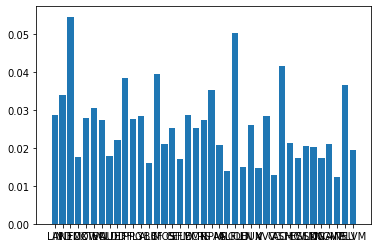

In [269]:
# plot the weights
plt.bar(["LIN", "APD", "NEM","FCX","DOW","CTVA","ECL","NUE","DD","IFF","PPG","LYB","ALB","CF","MOS","CE","STLD","FMC","EMN", "RS", "RPM","AA","CLF","RGLD","OLN","HUN","X","VVV","CC","ASH","CMC","ESI","WLK","SMG","DNA","NGVT","MP","NEU","SLVM"],get_weights(), align='center')

# Evaluate the performance of ETF

In [350]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

-0.0612

In [351]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.17

In [352]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

-0.3598

In [273]:
# Sharpe ratio
# Consideraetion of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

1.922

Comparing our ETF set with UYM, we can find that our expected annual return is 5.84%, much higher than the -78.21% for the UYM in the market. In addition, our annual volatility is much lower than the market UYM as 23.01% is much lower than 87.16%. And this is probably because this market ETF contains stocks that were newly introduced to the market. Overall, the Sharpe ratio at 0.254 indicates that our ETF performs better than natural UYM as it's only -0.99 for the market UYM.

# Evaluation of two models

Evaluation of return table

From the above analysis of 3 different ETFs, we found that risk-parity portfolio generally performs better than the market etf with higer annualized return, lower volatility and higher Sharpee ratio whereas mean-variance ones generate much higher volatility whereas their returns are extremely higher than both risk-parity ones and market-established ones. Hence, we may need to determine why the market etfs work that way and the possible improvement behind.

# Test for ETF with more than 50 stocks

# Let's work on AIA

In [553]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged




In [554]:
# we plan to evaluate the 3-year data 

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 
from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged
# call the function and generate a table with stock adjusted close prices
stocks = ["2330.TW", "0700.HK", "005930.KS","9988.HK","1299.HK","3690.HK","0939.HK","9618.HK","0388.HK","2317.TW","2454.TW","9888.HK","2318.HK","D05.SI","000660.KS","1398.HK","9999.HK","005935.KS","O39.SI","1211.HK","3988.HK","U11.SI","2269.HK","035420.KS","3968.HK","006400.KS","051910.KS","1810.HK","2331.HK","005380.KS","0016.HK","0001.HK","0669.HK","2303.TW","0823.HK","2891.TW","035720.KS","2881.TW","2412.TW","1303.TW","1301.TW","000270.KS","055550.KS","2882.TW","2308.TW","105560.KS","0002.HK","005490.KS","068270.KS","2020.HK","0003.HK","005387.KS","STLAX","051915.KS","005385.KS","MCHI"]
portfolio=combine_stocks(stocks)
portfolio.head()

               2330.TW
Date                  
2018-06-19  195.793228
2018-06-20  196.663406
2018-06-21  197.098511
2018-06-22  197.968704
2018-06-25  196.615829
               0700.HK
Date                  
2018-06-19  391.696777
2018-06-20  395.053101
2018-06-21  391.696777
2018-06-22  392.289062
2018-06-25  383.799683
               005930.KS
Date                    
2018-06-19  41614.960938
2018-06-20  41614.960938
2018-06-21  41659.234375
2018-06-22  41836.312500
2018-06-25  41305.070312
               9988.HK
Date                  
2019-11-26  187.600006
2019-11-27  193.199997
2019-11-28  204.000000
2019-11-29  198.399994
2019-12-02  195.500000
              1299.HK
Date                 
2018-06-19  63.455517
2018-06-20  65.008949
2018-06-21  63.690884
2018-06-22  64.585289
2018-06-25  63.267212
              3690.HK
Date                 
2018-09-20  72.650002
2018-09-21  72.099998
2018-09-24  69.000000
2018-09-26  68.800003
2018-09-27  67.000000
             0939.HK
Date         

               STLAX
Date                
2018-06-19  8.079822
2018-06-20  8.079822
2018-06-21  8.079822
2018-06-22  8.057824
2018-06-25  8.021166
                051915.KS
Date                     
2018-06-19  194800.656250
2018-06-20  193457.203125
2018-06-21  186739.953125
2018-06-22  182709.578125
2018-06-25  188083.390625
               005385.KS
Date                    
2018-06-19  68793.046875
2018-06-20  68385.515625
2018-06-21  66592.328125
2018-06-22  67896.453125
2018-06-25  68548.523438
                 MCHI
Date                 
2018-06-19  64.457451
2018-06-20  64.428963
2018-06-21  63.185020
2018-06-22  63.688293
2018-06-25  61.998043
               2330.TW     0700.HK     005930.KS  9988.HK    1299.HK  3690.HK  \
Date                                                                            
2018-06-19  195.793228  391.696777  41614.960938      NaN  63.455517      NaN   
2018-06-20  196.663406  395.053101  41614.960938      NaN  65.008949      NaN   
2018-06-21  197.09

,2330.TW,0700.HK,005930.KS,9988.HK,1299.HK,3690.HK,0939.HK,9618.HK,0388.HK,2317.TW,2454.TW,9888.HK,2318.HK,D05.SI,000660.KS,1398.HK,9999.HK,005935.KS,O39.SI,1211.HK,3988.HK,U11.SI,2269.HK,035420.KS,3968.HK,006400.KS,051910.KS,1810.HK,2331.HK,005380.KS,0016.HK,0001.HK,0669.HK,2303.TW,0823.HK,2891.TW,035720.KS,2881.TW,2412.TW,1303.TW,1301.TW,000270.KS,055550.KS,2882.TW,2308.TW,105560.KS,0002.HK,005490.KS,068270.KS,2020.HK,0003.HK,005387.KS,STLAX,051915.KS,005385.KS,MCHI
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,195.793228,391.696777,41614.960938,NaN,63.455517,NaN,5.572522,NaN,225.065414,84.027534,251.259995,NaN,67.172073,22.180656,79145.695312,4.548797,NaN,32123.060547,10.046545,49.225189,2.788606,23.054531,28.183332,136573.359375,25.993769,213331.734375,330734.06250,NaN,8.340384,117866.531250,101.225670,72.013382,42.049538,14.527616,59.671261,16.823866,21392.445312,40.604244,89.628860,62.241791,81.453873,28530.425781,37644.777344,42.816422,95.115135,45232.671875,67.701096,285013.93750,257103.015625,40.544075,10.825688,74891.734375,8.079822,194800.656250,68793.046875,64.457451
2018-06-20,196.663406,395.053101,41614.960938,NaN,65.008949,NaN,5.557761,NaN,225.428741,84.027534,249.649323,NaN,66.910713,22.106998,82627.726562,4.541389,NaN,32209.875000,10.097370,47.940193,2.795648,23.158541,28.166666,136771.875000,25.866144,226171.171875,334519.28125,NaN,8.584256,116073.890625,101.892181,71.804893,41.532154,14.407882,60.598690,17.018589,21693.750000,41.140522,90.451141,63.444534,82.998009,28350.421875,37272.054688,43.205666,95.545517,45232.671875,68.335411,287109.62500,265598.593750,42.973866,11.017949,74151.867188,8.079822,193457.203125,68385.515625,64.428963
2018-06-21,197.098511,391.696777,41659.234375,NaN,63.690884,NaN,5.476571,NaN,221.614059,83.723824,251.259995,NaN,66.300835,22.123362,83286.492188,4.489530,NaN,32253.291016,10.055015,47.149429,2.760439,22.993864,28.900000,138756.953125,25.568340,223208.218750,330734.06250,NaN,8.320875,113833.093750,101.059044,70.679031,41.014767,14.088594,59.485218,16.901754,21492.880859,41.293751,90.040001,63.294186,83.770096,27720.412109,36278.136719,43.517052,95.115135,43262.464844,67.701096,284175.65625,261127.250000,41.354012,10.973581,73165.359375,8.079822,186739.953125,66592.328125,63.185020
2018-06-22,197.968704,392.289062,41836.312500,NaN,64.585289,NaN,5.447049,NaN,219.979202,83.318863,250.051987,NaN,65.908791,22.008780,84227.570312,4.467305,NaN,32513.744141,9.953363,48.411781,2.746355,22.803186,29.916666,143521.125000,25.355625,224195.859375,324583.09375,NaN,8.467198,116522.062500,101.558929,70.720734,41.438080,14.208326,59.956303,17.018589,22898.955078,41.140522,90.451141,63.594872,84.542160,28170.417969,36278.136719,43.594906,95.115135,43426.648438,67.827957,287947.87500,264257.218750,41.354012,11.047526,75631.609375,8.057824,182709.578125,67896.453125,63.688293
2018-06-25,196.615829,383.799683,41305.070312,NaN,63.267212,NaN,5.395382,NaN,217.254456,82.508957,249.649323,NaN,64.906868,21.820530,79804.453125,4.422853,NaN,32557.158203,9.826301,46.874111,2.725229,22.725183,28.933332,148483.843750,25.142912,222714.375000,332153.53125,NaN,8.135533,115625.734375,100.309235,70.011856,40.685516,14.208326,60.427387,16.940701,22898.955078,40.757469,90.040001,63.895557,84.928207,28305.421875,36650.855469,43.283512,94.684746,44740.121094,67.827957,296749.78125,264704.343750,39.829430,11.224997,76782.531250,8.021166,188083.390625,68548.523438,61.998043


# Mean-Variance Portfolio Building

Method 1: We use package for the first trial

In [555]:
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [556]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

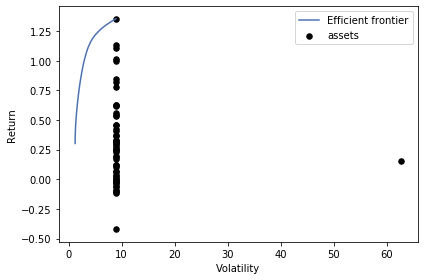

In [542]:
from pypfopt import plotting
# plot the efficient frontier
fig, ax = plt.subplots()
plotting.plot_efficient_frontier(ef,ax=ax,show_assets=True)
#plt.show()

In [557]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'2330.TW': 0.04048, '0700.HK': 0.012, '005930.KS': 0.01827, '9988.HK': 0.00877, '1299.HK': 0.01111, '3690.HK': 0.0591, '0939.HK': 0.0, '9618.HK': 0.02078, '0388.HK': 0.02191, '2317.TW': 0.00429, '2454.TW': 0.04536, '9888.HK': 0.0, '2318.HK': 0.0033, 'D05.SI': 0.0, '000660.KS': 0.01152, '1398.HK': 0.0, '9999.HK': 0.02605, '005935.KS': 0.02522, 'O39.SI': 0.0, '1211.HK': 0.0402, '3988.HK': 0.0, 'U11.SI': 0.0, '2269.HK': 0.04971, '035420.KS': 0.03497, '3968.HK': 0.02617, '006400.KS': 0.0357, '051910.KS': 0.02713, '1810.HK': 0.00923, '2331.HK': 0.08695, '005380.KS': 0.01785, '0016.HK': 0.00065, '0001.HK': 0.0, '0669.HK': 0.04266, '2303.TW': 0.04418, '0823.HK': 0.00228, '2891.TW': 0.00357, '035720.KS': 0.07847, '2881.TW': 0.01277, '2412.TW': 0.00332, '1303.TW': 0.00285, '1301.TW': 0.0018, '000270.KS': 0.0351, '055550.KS': 0.0, '2882.TW': 0.00144, '2308.TW': 0.04052, '105560.KS': 0.0003, '0002.HK': 0.00038, '005490.KS': 0.00036, '068270.KS': 0.0, '2020.HK': 0.04318, '0003.HK': 0.0, '005387.K

The optimal portfolio asks us to assign weights of 1.155%, 0.247%, 7.545%, 1.645%, 2.136%, 1.774%, 10.51%, 15.826%, 20.575%,  16.209%, 2.667%, 6.623%, 6.149%, 0.566%, 6.362% to 0939.HK, 2317.TW, D05.SI, 1398.HK, O39.SI, 1211.HK, 3988.HK, U11.SI, 2891.TW, 2412.TW, 1303.TW, 1301.TW, 055550.KS, 2882.TW, 105560.KS stocks respectively whereas
other stocks occupy 0 weight, indicating one of the weakness of mean-variance portfolio that extremal weights are assigned (weight concentrated on only several stocks).

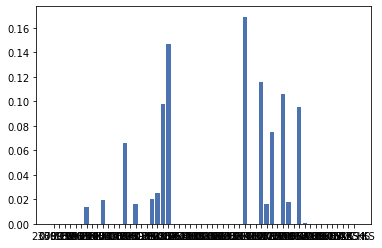

In [264]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [558]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 46.2%
Annual volatility: 152.6%
Sharpe Ratio: 0.29


(0.46218038964101027, 1.5261353609624038, 0.28973864373482877)

Comparing our ETF set with AIA, we can find that our expected annual return is 34,65%, much higher than the 1.79% for the AIA in the market. However, our annual volatility is much higher than the market DIA as 214.8% is much higher than 26.41%. And this is probably because of the extremal weights within the entire portfolio for our ETF design whereas the market AIA ETF assign weights to 57 stocks. Overall, the Sharpe ratio at 0.15 indicates that our ETF performs better than natural AIA as it's only 0.05 for the market DIA.

Method 2: try to code without using package

In [559]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df=df.dropna()

Method 2-2: use scipy minimize to write the algorithm; however, constraint for target return hard to edit

In [560]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
# instantiate empty list containers for returns and sd
list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)

In [112]:
# User defined Sharpe ratio function
# Negative sign to compute the negative value of Sharpe ratio
def sharpe_fun(weights):
  return - (portfolio_returns(weights) / portfolio_sd(weights))
# We use an anonymous lambda function
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1},{'type': 'ineq', 'fun': lambda x: x})
# This creates 30 tuples of (0, 1), all of which exist within a container tuple
# We essentially create a sequence of (min, max) pairs
bounds = tuple((0, 1) for w in weights)
# Repeat the list with the value (1 / 30) 30 times, and convert list to array
equal_weights = np.array([1 / len(df.columns)] * len(df.columns))

In [113]:
# Minimization results
max_sharpe_results = sco.minimize(
  # Objective function
  fun = sharpe_fun, 
  # Initial guess, which is the equal weight array
  x0 = equal_weights, 
  method = 'SLSQP',
  bounds = bounds, 
  constraints = constraints
)

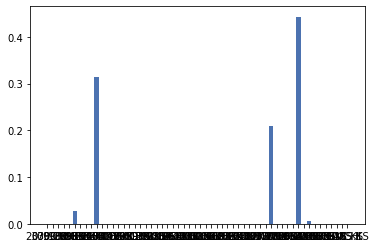

In [114]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,max_sharpe_results["x"], align='center')
plt.show() 

Method 2-3: use minimize scipy to calculate weights minimizing volatility and use idmax for maximum sharpe ratio 

In [115]:
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [116]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.2
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

array([ True,  True,  True, ...,  True,  True,  True])

In [117]:
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.02 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

Returns         0.552800
Volatility      0.093395
Sharpe Ratio    3.777511
Name: 55280, dtype: float64

In [121]:
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

array([2.91536213e-16, 1.91392896e-16, 1.74305502e-16, 0.00000000e+00,
       0.00000000e+00, 2.96114489e-02, 0.00000000e+00, 3.93240453e-16,
       8.15336758e-17, 3.17486012e-01, 3.51019087e-16, 3.00784562e-16,
       0.00000000e+00, 0.00000000e+00, 1.47538550e-17, 0.00000000e+00,
       4.08619200e-16, 0.00000000e+00, 5.55618467e-17, 1.24873389e-17,
       0.00000000e+00, 0.00000000e+00, 6.75016939e-17, 1.37188958e-16,
       0.00000000e+00, 2.38206858e-16, 7.31425500e-17, 0.00000000e+00,
       5.19921961e-17, 0.00000000e+00, 1.22383012e-17, 0.00000000e+00,
       8.08473102e-17, 2.09347591e-16, 1.31542795e-16, 0.00000000e+00,
       2.01395488e-16, 0.00000000e+00, 0.00000000e+00, 1.37480402e-16,
       1.20691691e-17, 2.15230592e-01, 4.35421436e-16, 1.00545733e-16,
       0.00000000e+00, 0.00000000e+00, 4.32524389e-01, 0.00000000e+00,
       5.14755901e-03, 1.30286072e-16, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 3.03719901e-16, 0.00000000e+00])

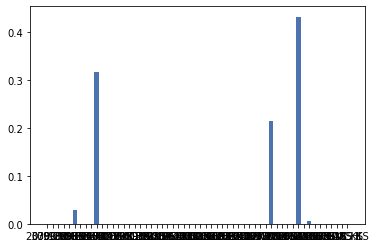

In [119]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,weight["x"], align='center')
plt.show()

# Risk-Parity Portfolio

In [122]:
df.cov()

,2330.TW,0700.HK,005930.KS,9988.HK,1299.HK,3690.HK,0939.HK,9618.HK,0388.HK,2317.TW,2454.TW,9888.HK,2318.HK,D05.SI,000660.KS,1398.HK,9999.HK,005935.KS,O39.SI,1211.HK,3988.HK,U11.SI,2269.HK,035420.KS,3968.HK,006400.KS,051910.KS,1810.HK,2331.HK,005380.KS,0016.HK,0001.HK,0669.HK,2303.TW,0823.HK,2891.TW,035720.KS,2881.TW,2412.TW,1303.TW,1301.TW,000270.KS,055550.KS,2882.TW,2308.TW,105560.KS,0002.HK,005490.KS,068270.KS,2020.HK,0003.HK,005387.KS,STLAX,051915.KS,005385.KS,MCHI
2330.TW,0.000301,0.000369,0.000159,0.000595,0.000142,0.000355,0.000100,0.000498,0.000206,0.000101,0.000201,0.000552,0.000232,0.000098,0.000199,0.000073,0.000377,0.000149,0.000118,0.000368,0.000080,0.000117,0.000318,0.000247,0.000383,0.000137,0.000352,0.000427,0.000288,0.000101,0.000110,0.000120,0.000359,0.000252,0.000053,0.000147,0.000296,0.000242,0.000025,0.000145,0.000116,0.000063,0.000098,0.000173,0.000294,0.000106,0.000036,0.000183,0.000073,0.000269,0.000110,0.000067,0.000008,0.000250,0.000076,-0.000009
0700.HK,0.000369,0.001396,0.000394,0.001815,0.000359,0.001681,0.000160,0.001806,0.000610,0.000081,0.000184,0.001471,0.000615,0.000221,0.000443,0.000126,0.001157,0.000279,0.000321,0.000927,0.000102,0.000138,0.001284,0.000439,0.000806,0.000424,0.000623,0.001197,0.000865,0.000181,0.000117,0.000096,0.000624,0.000093,0.000103,0.000155,0.000494,0.000261,-0.000009,0.000216,0.000149,0.000215,0.000105,0.000131,0.000480,0.000039,0.000009,0.000237,0.000286,0.000821,0.000110,0.000118,-0.000035,0.000362,0.000151,0.000383
005930.KS,0.000159,0.000394,0.000191,0.000553,0.000102,0.000474,0.000066,0.000516,0.000193,0.000068,0.000119,0.000482,0.000218,0.000104,0.000172,0.000064,0.000355,0.000152,0.000108,0.000311,0.000043,0.000070,0.000304,0.000157,0.000291,0.000154,0.000252,0.000360,0.000223,0.000056,0.000094,0.000082,0.000221,0.000065,0.000060,0.000048,0.000144,0.000136,-0.000020,0.000084,0.000088,0.000007,0.000060,0.000102,0.000167,0.000038,0.000026,0.000136,-0.000109,0.000180,0.000064,0.000025,-0.000012,0.000162,0.000044,0.000105
9988.HK,0.000595,0.001815,0.000553,0.002736,0.000551,0.002162,0.000269,0.002759,0.000854,0.000172,0.000232,0.002239,0.000899,0.000385,0.000579,0.000234,0.001602,0.000437,0.000465,0.001215,0.000181,0.000245,0.001696,0.000598,0.001304,0.000650,0.000987,0.001759,0.001134,0.000216,0.000157,0.000200,0.000819,0.000293,0.000164,0.000315,0.000740,0.000455,0.000026,0.000335,0.000246,0.000212,0.000208,0.000275,0.000781,0.000131,0.000026,0.000434,0.000556,0.001065,0.000182,0.000225,-0.000067,0.000612,0.000255,0.000447
1299.HK,0.000142,0.000359,0.000102,0.000551,0.000398,0.000314,0.000140,0.000542,0.000239,0.000077,0.000092,0.000533,0.000319,0.000053,0.000128,0.000131,0.000337,0.000105,0.000076,0.000346,0.000107,0.000151,0.000399,0.000163,0.000618,0.000203,0.000214,0.000479,0.000388,0.000080,0.000065,0.000161,0.000321,0.000181,0.000050,0.000010,0.000190,0.000065,-0.000004,0.000063,0.000084,0.000032,0.000105,0.000036,0.000216,0.000079,0.000035,0.000228,0.000116,0.000318,0.000103,0.000108,0.000043,0.000134,0.000082,0.000178
3690.HK,0.000355,0.001681,0.000474,0.002162,0.000314,0.002337,0.000147,0.002414,0.000776,0.000059,0.000151,0.001826,0.000633,0.000286,0.000501,0.000136,0.001485,0.000302,0.000384,0.001247,0.000112,0.000122,0.001714,0.000451,0.000837,0.000485,0.000727,0.001549,0.001099,0.000229,0.000133,0.000031,0.000584,-0.000080,0.000152,0.000188,0.000545,0.000323,0.000042,0.000235,0.000147,0.000245,0.000077,0.000129,0.000466,-0.000038,-0.000013,0.000167,0.000280,0.000998,0.000092,0.000137,-0.000085,0.000363,0.000173,0.000571
0939.HK,0.000100,0.000160,0.000066,0.000269,0.000140,0.000147,0.000127,0.000224,0.000126,0.000068,0.000079,0.000267,0.000190,0.000065,0.000081,0.000102,0.000183,0.000077,0.000042,0.000202,0.000095,0.000085,0.000236,0.000122,0.000352,0.000128,0.000274,0.000234,0.000132,0.000047,0.000066,0.000108,0.000171,0.000177,0.000055,0.000042,0.000168,0.000079,-0.000033,0.000056,0.000060,-0.000001,0.000068,0.000054,0.000085,0.000073,0.000027,0.000153

In [561]:
ze=[0.45]
for i in range(55):
    ze.append(0.01)

In [562]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=df.columns,
                start_date=datetime.datetime(2022,1,1),
                end_date=datetime.datetime(2022,3,31)):

    # We download the prices from Yahoo Finance
    '''prices = pd.DataFrame([web.DataReader(t,
                                          'yahoo',
                                          start_date,
                                          end_date).loc[:, 'Adj Close']
                           for t in yahoo_tickers],
                          index=yahoo_tickers).T.asfreq('B').ffill()'''
    stocks = ["2330.TW", "0700.HK", "005930.KS","9988.HK","1299.HK","3690.HK","0939.HK","9618.HK","0388.HK","2317.TW","2454.TW","9888.HK","2318.HK","D05.SI","000660.KS","1398.HK","9999.HK","005935.KS","O39.SI","1211.HK","3988.HK","U11.SI","2269.HK","035420.KS","3968.HK","006400.KS","051910.KS","1810.HK","2331.HK","005380.KS","0016.HK","0001.HK","0669.HK","2303.TW","0823.HK","2891.TW","035720.KS","2881.TW","2412.TW","1303.TW","1301.TW","000270.KS","055550.KS","2882.TW","2308.TW","105560.KS","0002.HK","005490.KS","068270.KS","2020.HK","0003.HK","005387.KS","STLAX","051915.KS","005385.KS","MCHI"]
    prices=portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = ze
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

2330.TW      3.042257e-01
0700.HK      6.263615e-03
005930.KS    5.357497e-03
9988.HK      5.353345e-02
1299.HK      1.231508e-02
3690.HK      4.323568e-03
0939.HK      2.390336e-02
9618.HK      3.700679e-02
0388.HK      7.251663e-03
2317.TW      4.323611e-03
2454.TW      1.000340e-02
9888.HK      2.607908e-02
2318.HK      2.153754e-02
D05.SI       6.523128e-03
000660.KS    4.608486e-03
1398.HK      2.552706e-02
9999.HK      1.661655e-02
005935.KS    3.760113e-03
O39.SI       1.263996e-02
1211.HK      3.015259e-03
3988.HK      4.851044e-02
U11.SI       1.140830e-02
2269.HK      3.296402e-03
035420.KS    5.042135e-03
3968.HK      5.329991e-03
006400.KS    2.566437e-03
051910.KS    2.633668e-03
1810.HK      6.400998e-03
2331.HK      8.089680e-03
005380.KS    2.465889e-03
0016.HK      1.277700e-02
0001.HK      4.375245e-02
0669.HK      5.860280e-03
2303.TW      1.613639e-02
0823.HK      2.836514e-02
2891.TW      1.390448e-02
035720.KS    2.948656e-03
2881.TW      8.601115e-03
2412.TW     

<BarContainer object of 56 artists>

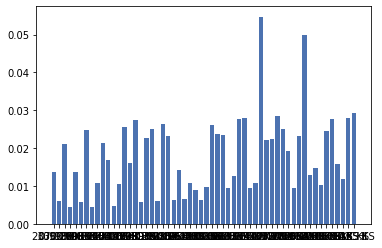

In [125]:
# plot the weights
plt.bar(df.columns,get_weights(), align='center')




In [563]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

0.39

In [564]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.2865

In [565]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

1.3614

In [51]:
# consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

-0.8734

Comparing our ETF set with AIA, we can find that our expected annual return is -2.42%, lower than the 1.79% for the AIA in the market. In addition, our annual volatility is also lower than the market AIA as 14.48% is slightly lower than 26.41%. Overall, the Sharpe ratio at -0.167 also indicates that our ETF performs worse than natural AIA as it's only 0.05 for the market AIA.(Notice: even consider the risk-free rate, Sharpe ratio of -0.3831 is also lower than 0.17)

# Let's evaluate AIQ

Firstly extract data

In [768]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged




In [769]:
# call the function and generate a table with stock adjusted close prices
stocks = ["BABA", "MSFT", "IBM","GOOGL","AAPL","ACN","ORCL","3690.HK","CRM","0700.HK","AMZN","CSCO","ADBE","TSLA","QCOM","INTC","005930.KS","NVDA","NOW","SIE.DE","META","NFLX","000660.KS","TRI","SNPS","UBER","CDNS","SHOP","BIDU","NXPL","IFX.DE","6954.T","TWTR","STM","WDAY","EBAY","DDOG","EXPN.L","WKL.AS","ERIC","ZS","ROK","TTD","MNDT","SNAP","6502.T","HPE","NLSN","TWLO","STX","ZBRA","SPLK","SMCI","BAH","DXC","OKTA","TDC","3443.TW","CCCS","HUBB","ABMD","G","2395.TW","6701.T","2353.TW","CAN","VRNT","AVV.L","AI","3661.TW","VNET","AMP","TEMN.SW","VSAT","PATH","ZEN","SMAR","PEGA","WIX","AMBA","UPST"]
portfolio=combine_stocks(stocks)
portfolio

                  BABA
Date                  
2018-06-19  204.429993
2018-06-20  206.229996
2018-06-21  202.210007
2018-06-22  202.009995
2018-06-25  191.250000
                 MSFT
Date                 
2018-06-19  96.315262
2018-06-20  97.279755
2018-06-21  96.582642
2018-06-22  95.885529
2018-06-25  93.956551
                   IBM
Date                  
2018-06-19  113.257141
2018-06-20  112.257584
2018-06-21  111.171455
2018-06-22  111.195053
2018-06-25  109.235313
                GOOGL
Date                 
2018-06-19  58.934502
2018-06-20  59.203499
2018-06-21  58.472000
2018-06-22  58.464500
2018-06-25  56.964001
                 AAPL
Date                 
2018-06-19  44.629757
2018-06-20  44.824421
2018-06-21  44.574467
2018-06-22  44.444683
2018-06-25  43.783730
                   ACN
Date                  
2018-06-19  153.959930
2018-06-20  152.508118
2018-06-21  150.867722
2018-06-22  150.490631
2018-06-25  147.219299
                 ORCL
Date                 
2018-06-19 

                  BAH
Date                 
2018-06-19  42.525410
2018-06-20  42.647121
2018-06-21  42.207085
2018-06-22  41.757664
2018-06-25  41.261444
                  DXC
Date                 
2018-06-19  79.463745
2018-06-20  78.755783
2018-06-21  77.569489
2018-06-22  77.349426
2018-06-25  75.416901
                 OKTA
Date                 
2018-06-19  52.930000
2018-06-20  53.689999
2018-06-21  53.220001
2018-06-22  51.889999
2018-06-25  49.020000
                  TDC
Date                 
2018-06-19  43.459999
2018-06-20  43.340000
2018-06-21  42.680000
2018-06-22  41.080002
2018-06-25  39.910000
               3443.TW
Date                  
2018-06-19  292.415588
2018-06-20  277.794800
2018-06-21  286.755951
2018-06-22  291.472321
2018-06-25  272.135162
             CCCS
Date             
2020-10-05  11.78
2020-10-06  11.78
2020-10-07  11.60
2020-10-08  11.37
2020-10-09  11.40
                 HUBB
Date                 
2018-06-19  99.842911
2018-06-20  98.684067
2018-06-2

,BABA,MSFT,IBM,GOOGL,AAPL,ACN,ORCL,3690.HK,CRM,0700.HK,AMZN,CSCO,ADBE,TSLA,QCOM,INTC,005930.KS,NVDA,NOW,SIE.DE,META,NFLX,000660.KS,TRI,SNPS,UBER,CDNS,SHOP,BIDU,NXPL,IFX.DE,6954.T,TWTR,STM,WDAY,EBAY,DDOG,EXPN.L,WKL.AS,ERIC,ZS,ROK,TTD,MNDT,SNAP,6502.T,HPE,NLSN,TWLO,STX,ZBRA,SPLK,SMCI,BAH,DXC,OKTA,TDC,3443.TW,CCCS,HUBB,ABMD,G,2395.TW,6701.T,2353.TW,CAN,VRNT,AVV.L,AI,3661.TW,VNET,AMP,TEMN.SW,VSAT,PATH,ZEN,SMAR,PEGA,WIX,AMBA,UPST
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,204.429993,96.315262,113.257141,58.934502,44.629757,153.959930,43.157013,NaN,139.520004,391.696777,86.738998,38.604801,251.740005,70.510002,52.632137,47.768623,41614.960938,64.501770,183.610001,102.361595,197.490005,404.980011,79145.687500,37.615788,89.199997,NaN,44.919998,17.061001,262.109985,20.700001,23.334204,20440.396484,44.950001,23.849497,129.559998,37.306866,NaN,1734.413696,44.138988,7.483694,39.160000,157.484146,9.149000,16.990000,13.310000,2965.715332,14.094712,27.618473,59.799999,49.893528,152.559998,116.739998,25.250000,42.525410,79.463745,52.930000,43.459999,292.415588,NaN,99.842911,439.640015,29.450483,166.696976,2963.944092,21.203598,NaN,22.975039,2160.258057,NaN,138.854279,8.650000,135.842560,144.013657,64.209999,NaN,58.049999,28.910000,59.300674,106.500000,43.119999,NaN
2018-06-20,206.229996,97.279755,112.257584,59.203499,44.824421,152.508118,39.939121,NaN,138.940002,395.053101,87.503998,38.534321,251.240005,72.444000,52.712830,48.246941,41614.960938,65.032326,184.759995,102.555199,202.000000,416.760010,82627.718750,37.774651,90.309998,NaN,45.200001,17.225000,264.059998,28.500000,23.334204,20781.148438,46.130001,23.424995,128.179993,37.383041,NaN,1738.603149,44.437672,7.559864,37.884998,158.002151,9.336000,16.940001,12.800000,3001.446533,13.429865,27.699568,59.520000,50.005459,153.029999,115.870003,25.250000,42.647121,78.755783,53.689999,43.340000,277.794800,NaN,98.684067,446.209991,29.277020,167.516129,2968.709229,21.123281,NaN,23.229750,2180.133057,NaN,137.407867,8.580000,134.605972,144.996689,64.889999,NaN,59.049999,27.070000,59.051937,107.599998,44.320000,NaN
2018-06-21,202.210007,96.582642,111.171455,58.472000,44.574467,150.867722,40.200279,NaN,137.880005,391.696777,86.511002,38.023346,248.830002,69.501999,52.676968,47.100792,41659.226562,63.743122,180.270004,101.006393,201.500000,415.440002,83286.484375,37.840069,89.230003,NaN,44.900002,16.454000,260.500000,24.000000,22.739090,21051.878906,45.240002,22.932953,125.760002,36.192795,NaN,1721.318848,44.615009,7.340876,35.209999,155.523209,9.154000,16.559999,13.240000,2992.514404,13.669211,27.843744,56.959999,50.315407,150.690002,113.169998,25.049999,42.207085,77.569489,53.220001,42.680000,286.755951,NaN,97.706268,438.269989,29.122829,166.696976,2949.648438,21.163441,NaN,22.975039,2181.662109,NaN,133.550812,8.520000,134.147995,146.078033,64.080002,NaN,57.459999,26.520000,57.808205,105.650002,43.680000,NaN
2018-06-22,202.009995,95.885529,111.195053,58.464500,44.444683,150.490631,41.133003,NaN,135.009995,392.289093,85.783501,38.058594,243.630005,66.725998,52.452808,47.380562,41836.312500,62.215935,176.699997,102.343994,201.740005,411.089996,84227.578125,38.055023,88.120003,NaN,43.869999,16.253000,259.000000,24.000000,22.182371,20753.140625,45.880001,22.547035,124.010002,36.268974,NaN,1749.135376,45.445709,7.398004,36.630001,155.375229,9.206000,16.370001,13.200000,3010.380127,13.509645,28.041990,55.250000,50.125996,147.880005,105.230003,24.900000,41.757664,77.349426,51.889999,41.080002,291.472321,NaN,98.910416,427.290009,29.190287,165.468262,2940.118164,20.681540,NaN,23.153337,2193.892822,NaN,137.407867,8.800000,134.065567,146.372925,64.300003,NaN,54.759998,24.309999,56.166504,101.949997,43.240002,NaN
2018-06-25,191.250000,93.956551,109.235313,56.964001,43.783730,147.219299,41.300903,NaN,133.190002,383.799683,83.157501,37.256893,239.679993,66.601997,51.152699,45.765106,41305.054688,59.283020,171.389999,99.545601,196.350006,384.480011,79804.453125

# Mean-variance Portfolio Building for AIQ

Method 1: We use package for the first trial

In [770]:
from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import CovarianceShrinkage
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [771]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [772]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'BABA': 0.0, 'MSFT': 0.01216, 'IBM': 0.0, 'GOOGL': 0.0074, 'AAPL': 0.01386, 'ACN': 0.00454, 'ORCL': 0.0056, '3690.HK': 0.02264, 'CRM': 0.0019, '0700.HK': 0.0, 'AMZN': 0.00681, 'CSCO': 0.0, 'ADBE': 0.0069, 'TSLA': 0.03956, 'QCOM': 0.0098, 'INTC': 0.0, '005930.KS': 0.00821, 'NVDA': 0.01032, 'NOW': 0.01163, 'SIE.DE': 0.0, 'META': 0.00242, 'NFLX': 0.0, '000660.KS': 0.00489, 'TRI': 0.01372, 'SNPS': 0.01311, 'UBER': 0.0, 'CDNS': 0.01229, 'SHOP': 0.0382, 'BIDU': 0.0, 'NXPL': 0.0, 'IFX.DE': 0.0, '6954.T': 0.0, 'TWTR': 0.0, 'STM': 0.0, 'WDAY': 0.00145, 'EBAY': 0.00358, 'DDOG': 0.02812, 'EXPN.L': 0.00189, 'WKL.AS': 0.00367, 'ERIC': 0.0033, 'ZS': 0.02687, 'ROK': 0.00389, 'TTD': 0.02879, 'MNDT': 0.0, 'SNAP': 0.023, '6502.T': 0.0, 'HPE': 0.0, 'NLSN': 0.0, 'TWLO': 0.02782, 'STX': 0.00393, 'ZBRA': 0.01593, 'SPLK': 0.0, 'SMCI': 0.0, 'BAH': 0.00853, 'DXC': 0.0, 'OKTA': 0.02146, 'TDC': 0.0, '3443.TW': 0.0, 'CCCS': 0.0, 'HUBB': 0.00486, 'ABMD': 0.0, 'G': 0.00168, '2395.TW': 0.00603, '6701.T': 0.00409, '

The optimal portfolio asks us to assign weights of 2.606%, 0.404%, 2.98%, 4.54%, 1.708%, 0.575%, 4.59%, 0.053%, 0.104%, 0.38%, 17.97%, 1.74%, 1.556%, 6.696%, 1.83%, 0.629%, 1.632%, 1.946%, 0.3704%, 2.972%, 0.226%, 3.244%, 0.589%, 2.252%, 0.197%, 4.694%, 2.966%, 0.453%, 2.365%, 2.365%, 1.05%, 1.931%, 1.029%, 1.307%, 0.035%, 0.535%, 0.834%, 1.421%, 0.386%, 6.879%, 1.873%, 1.109% and 1.92%% to MSFT, IBM, GOOGL, AAPL, ACN, ORCL, 3690.HK, CRM, AMZN, ADBE,TSLA,QCOM, 005930.KS,NVDA,NOW,SIE.DE,000660.KS,TRI, SNPS, CDNS, BIDU,IFX.DE, 6954.T, STM,EBAY,DDOG,ZS,ROK,TTD, MNDT,STX,ZBRA,SMCI,BAH,HUBB,G,2395.TW,6701.T,VRNT,AVV.L,3661.TW,AMP,AMBA, and UPST stocks respectively whereas other stocks occupy 0 weight, indicating one of the weakness of mean-variance portfolio that extremal weights are assigned (weight concentrated on only several stocks).

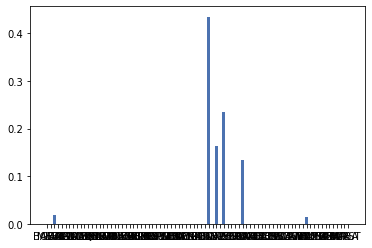

In [630]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [773]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 494.7%
Annual volatility: 50.2%
Sharpe Ratio: 9.82


(4.9473910235747995, 0.5017952937594619, 9.819524186164987)

Comparing our ETF set with AIQ, we can find that our expected annual return is 55.1%, much higher than the 11.04% for the AIQ in the market. However, our annual volatility is higher than the market AIQ as 27.9% is relatively lower than 27.98%. And this is probably because of the extremal weights on two stocks within the entire portfolio for our ETF design whereas the market AIQ ETF assign weights to 81 stocks. Overall, the Sharpe ratio at 1.91 indicates that our ETF performs better than natural ETF as it's only -0.36 for the market AIQ.

Method2: try to code without packages

In [774]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df

,BABA,MSFT,IBM,GOOGL,AAPL,ACN,ORCL,3690.HK,CRM,0700.HK,AMZN,CSCO,ADBE,TSLA,QCOM,INTC,005930.KS,NVDA,NOW,SIE.DE,META,NFLX,000660.KS,TRI,SNPS,UBER,CDNS,SHOP,BIDU,NXPL,IFX.DE,6954.T,TWTR,STM,WDAY,EBAY,DDOG,EXPN.L,WKL.AS,ERIC,ZS,ROK,TTD,MNDT,SNAP,6502.T,HPE,NLSN,TWLO,STX,ZBRA,SPLK,SMCI,BAH,DXC,OKTA,TDC,3443.TW,CCCS,HUBB,ABMD,G,2395.TW,6701.T,2353.TW,CAN,VRNT,AVV.L,AI,3661.TW,VNET,AMP,TEMN.SW,VSAT,PATH,ZEN,SMAR,PEGA,WIX,AMBA,UPST
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-06-20,0.008805,0.010014,-0.008826,0.004564,0.004362,-0.009430,-0.074562,NaN,-0.004157,0.008569,0.008820,-0.001826,-0.001986,0.027429,1.533137e-03,0.010013,0.000000,0.008225,0.006263,0.001891,0.022837,0.029088,0.043995,0.004223,0.012444,NaN,0.006233,0.009613,0.007440,0.376812,0.000000,0.016671,0.026251,-0.017799,-0.010651,0.002042,NaN,0.002415,0.006767,0.010178,-0.032559,0.003289,0.020439,-0.002943,-0.038317,1.204809e-02,-0.047170,0.002936,-0.004682,0.002243,0.003081,-0.007452,0.000000,2.862094e-03,-0.008909,0.014359,-0.002761,-0.050000,NaN,-0.011607,0.014944,-0.005890,0.004914,0.001608,-0.003788,NaN,0.011086,0.009200,NaN,-0.010417,-0.008092,-0.009103,0.006826,0.010590,NaN,0.017227,-0.063646,-0.004195,0.010329,0.027829,NaN
2018-06-21,-0.019493,-0.007166,-0.009675,-0.012356,-0.005576,-0.010756,0.006539,NaN,-0.007629,-0.008496,-0.011348,-0.013260,-0.009592,-0.040611,-6.803271e-04,-0.023756,0.001064,-0.019824,-0.024302,-0.015102,-0.002475,-0.003167,0.007973,0.001732,-0.011959,NaN,-0.006637,-0.044761,-0.013482,-0.157895,-0.025504,0.013028,-0.019293,-0.021005,-0.018880,-0.031839,NaN,-0.009941,0.003991,-0.028967,-0.070608,-0.015689,-0.019494,-0.022432,0.034375,-2.975941e-03,0.017822,0.005205,-0.043011,0.006198,-0.015291,-0.023302,-0.007921,-1.031809e-02,-0.015063,-0.008754,-0.015228,0.032258,NaN,-0.009908,-0.017794,-0.005267,-0.004890,-0.006421,0.001901,NaN,-0.010965,0.000701,NaN,-0.028070,-0.006993,-0.003402,0.007458,-0.012483,NaN,-0.026926,-0.020318,-0.021062,-0.018123,-0.014440,NaN
2018-06-22,-0.000989,-0.007218,0.000212,-0.000128,-0.002912,-0.002499,0.023202,NaN,-0.020815,0.001512,-0.008409,0.000927,-0.020898,-0.039941,-4.255356e-03,0.005940,0.004251,-0.023958,-0.019804,0.013243,0.001191,-0.010471,0.011299,0.005681,-0.012440,NaN,-0.022940,-0.012216,-0.005758,0.000000,-0.024483,-0.014191,0.014147,-0.016828,-0.013915,0.002105,NaN,0.016160,0.018619,0.007782,0.040330,-0.000951,0.005681,-0.011473,-0.003021,5.970138e-03,-0.011673,0.007120,-0.030021,-0.003764,-0.018648,-0.070160,-0.005988,-1.064800e-02,-0.002837,-0.024991,-0.037488,0.016447,NaN,0.012324,-0.025053,0.002316,-0.007371,-0.003231,-0.022770,NaN,0.007761,0.005606,NaN,0.028881,0.032864,-0.000614,0.002019,0.003433,NaN,-0.046989,-0.083333,-0.028399,-0.035021,-0.010073,NaN
2018-06-25,-0.053265,-0.020118,-0.017624,-0.025665,-0.014871,-0.021738,0.004082,NaN,-0.013480,-0.021641,-0.030612,-0.021065,-0.016213,-0.001858,-2.478628e-02,-0.034095,-0.012698,-0.047141,-0.030051,-0.027343,-0.026718,-0.064730,-0.052514,-0.012525,-0.018157,NaN,-0.012081,-0.057343,-0.033166,0.000000,-0.052791,-0.002249,-0.037271,-0.034232,-0.026530,-0.025729,NaN,-0.014286,-0.014377,-0.016731,-0.007371,-0.014645,-0.029546,-0.034820,-0.007576,-1.186966e-02,-0.011155,-0.004820,-0.014118,-0.041051,-0.038342,-0.038012,-0.032128,-1.188332e-02,-0.024984,-0.055309,-0.028481,-0.066343,NaN,-0.012906,-0.025954,-0.015847,-0.007426,-0.001621,-0.021359,NaN,-0.026403,-0.045296,NaN,-0.042105,-0.036364,-0.010864,-0.008059,-0.020529,NaN,-0.031227,0.107363,-0.033658,-0.044630,-0.031221,NaN
2018-06-26,0.000889,0.007013,0.002089,-0.005846,0.012406,0.004483,0.002936,NaN,0.017193,-0.007202,0.0167

In [775]:
df=df.dropna()

In [762]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
'''# instantiate empty list containers for returns and sd
list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)'''

'# instantiate empty list containers for returns and sd\nlist_portfolio_returns = []\nlist_portfolio_sd = []\n# For loop to simulate 5000 random weight vectors (numpy array objects)\nfor p in range(5000):\n  # Return random floats in the half-open interval [0.0, 1.0)\n  weights = np.random.random(size = len(df.columns)) \n  # Normalize to unity\n  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object\n  weights /= np.sum(weights) \n  # Lists are mutable so growing will not be memory inefficient\n  list_portfolio_returns.append(portfolio_returns(weights))\n  list_portfolio_sd.append(portfolio_sd(weights))\n  # Convert list to numpy arrays\n  port_returns = np.array(object = list_portfolio_returns)\n  port_sd = np.array(object = list_portfolio_sd)'

In [619]:
# User defined Sharpe ratio function
# Negative sign to compute the negative value of Sharpe ratio
def sharpe_fun(weights):
  return - (portfolio_returns(weights) / portfolio_sd(weights))
# We use an anonymous lambda function
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
# This creates 18 tuples of (0, 1), all of which exist within a container tuple
# We essentially create a sequence of (min, max) pairs
bounds = tuple((0, 1) for w in weights)
# Repeat the list with the value (1 / 18) 18 times, and convert list to array
equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
# Minimization results
max_sharpe_results = sco.minimize(
  # Objective function
  fun = sharpe_fun, 
  # Initial guess, which is the equal weight array
  x0 = equal_weights, 
  method = 'SLSQP',
  bounds = bounds, 
  constraints = constraints
)

In [33]:
# Extract the weight composition array which maximize the Sharpe ratio
max_sharpe_results["x"]

array([0.00000000e+00, 1.20120347e-11, 1.82522846e-02, 6.92348768e-12,
       0.00000000e+00, 8.71564992e-12, 1.04727809e-11, 9.47012060e-02,
       8.64143948e-13, 8.00600973e-12, 0.00000000e+00, 3.07757843e-12,
       6.61240952e-12, 0.00000000e+00, 8.10180741e-12, 1.04187263e-11,
       2.07300181e-11, 0.00000000e+00, 0.00000000e+00, 1.45291801e-11,
       0.00000000e+00, 0.00000000e+00, 2.09983080e-11, 2.07347427e-11,
       3.11631782e-02, 0.00000000e+00, 7.55485134e-12, 0.00000000e+00,
       0.00000000e+00, 2.91200971e-13, 1.62181884e-11, 1.75879794e-11,
       1.65727675e-11, 0.00000000e+00, 0.00000000e+00, 7.35654632e-12,
       0.00000000e+00, 2.03456965e-11, 2.19929350e-11, 1.07962318e-11,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.36032293e-11,
       0.00000000e+00, 5.66686290e-01, 1.35459755e-11, 1.62601659e-11,
       0.00000000e+00, 1.07144056e-11, 0.00000000e+00, 0.00000000e+00,
       3.69019363e-02, 1.42613569e-11, 7.91473547e-12, 0.00000000e+00,
      

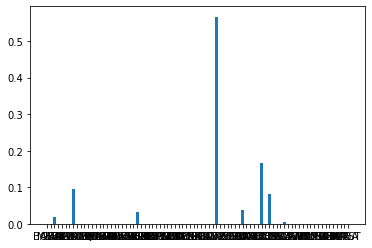

In [34]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,max_sharpe_results["x"], align='center')
plt.show()

Method 2-3: use minimize scipy to calculate weights minimizing volatility and use idmax for maximum sharpe ratio 

In [143]:
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [ ]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.2
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

In [ ]:
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.02 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

In [ ]:
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

In [ ]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,weight["x"], align='center')
plt.show() 

# Risk-Parity Portfolio

In [35]:
df.cov()

,BABA,MSFT,IBM,GOOGL,AAPL,ACN,ORCL,3690.HK,CRM,0700.HK,AMZN,CSCO,ADBE,TSLA,QCOM,INTC,005930.KS,NVDA,NOW,SIE.DE,META,NFLX,000660.KS,TRI,SNPS,UBER,CDNS,SHOP,BIDU,NXPL,IFX.DE,6954.T,TWTR,STM,WDAY,EBAY,DDOG,EXPN.L,WKL.AS,ERIC,ZS,ROK,TTD,MNDT,SNAP,6502.T,HPE,NLSN,TWLO,STX,ZBRA,SPLK,SMCI,BAH,DXC,OKTA,TDC,3443.TW,CCCS,HUBB,ABMD,G,2395.TW,6701.T,2353.TW,CAN,VRNT,AVV.L,AI,3661.TW,VNET,AMP,TEMN.SW,VSAT,PATH,ZEN,SMAR,PEGA,WIX,AMBA,UPST
BABA,0.001796,0.000673,-0.000020,0.000483,0.000647,0.000506,0.000369,0.001085,0.000797,0.000767,0.000699,3.217168e-04,0.000733,0.001418,0.000838,0.000421,2.610283e-04,0.001438,0.000912,0.000222,0.001190,0.001735,1.770492e-04,0.000243,0.000865,0.000950,0.000773,0.002224,0.001628,0.001000,0.000169,3.785188e-05,-0.000117,0.000816,0.000995,0.000584,0.001255,0.000240,0.000070,0.000551,0.001739,0.000432,0.001821,0.000103,0.001664,4.741693e-05,0.000422,0.000243,0.001364,0.000720,0.000929,0.001403,0.000917,0.000243,0.000730,0.001495,0.000714,0.000241,0.000844,0.000028,0.001177,0.000230,0.000364,0.000055,0.000172,0.001898,0.000664,-0.000004,0.001957,0.000402,0.001307,0.000657,0.000610,0.000670,0.001610,0.001037,1.269968e-03,0.001001,0.001807,1.478772e-03,0.002434
MSFT,0.000673,0.000764,0.000238,0.000533,0.000688,0.000628,0.000503,-0.000289,0.000787,-0.000186,0.000909,4.321402e-04,0.000640,0.000928,0.000871,0.000628,-6.791399e-05,0.001140,0.000794,0.000183,0.000829,0.000608,-1.005618e-04,0.000303,0.000781,0.000698,0.000728,0.001011,0.000820,0.000670,0.000113,-4.606915e-06,0.000072,0.000758,0.000853,0.000524,0.000882,0.000196,0.000105,0.000443,0.001102,0.000587,0.001063,0.000067,0.000709,-6.152251e-05,0.000465,0.000192,0.000735,0.000576,0.000660,0.000877,0.001054,0.000345,0.000639,0.001137,0.000358,-0.000135,0.000574,0.000171,0.000780,0.000385,0.000157,0.000047,0.000071,0.001336,0.000428,-0.000369,0.001141,0.000143,0.000532,0.000621,0.000325,0.000349,0.001050,0.000497,8.087878e-04,0.000166,0.001123,1.009300e-03,0.000639
IBM,-0.000020,0.000238,0.000602,0.000251,0.000304,0.000369,0.000296,-0.000207,0.000142,-0.000074,0.000401,4.862496e-04,0.000143,0.000248,0.000329,0.000309,2.521055e-06,0.000266,0.000192,0.000147,0.000091,-0.000826,-8.457229e-05,0.000125,0.000099,0.000116,0.000179,-0.000078,0.000030,0.000321,0.000241,6.377744e-05,0.000121,0.000415,0.000103,0.000279,0.000074,0.000257,0.000113,0.000246,0.000258,0.000319,0.000442,0.000021,0.000117,2.413784e-05,0.000344,0.000100,0.000032,0.000315,0.000255,0.000049,0.000695,0.000306,0.000349,0.000241,0.000182,-0.000151,0.000375,0.000252,0.000379,0.000260,0.000067,0.000076,0.000005,0.000337,0.000209,0.000050,0.000223,-0.000148,-0.000012,0.000351,0.000067,0.000306,0.000189,0.000021,7.638958e-05,0.000472,0.000115,3.639882e-04,0.001268
GOOGL,0.000483,0.000533,0.000251,0.000750,0.000676,0.000626,0.000491,-0.000233,0.000748,-0.000075,0.000932,6.010170e-04,0.000685,0.000826,0.000849,0.000643,1.624771e-05,0.001216,0.000778,0.000177,0.001122,0.001023,3.267843e-05,0.000231,0.000707,0.000709,0.000665,0.001359,0.000610,0.000108,0.000126,2.286842e-04,0.000053,0.000809,0.000717,0.000620,0.000921,0.000127,0.000100,0.000393,0.001079,0.000394,0.001305,0.000054,0.000986,-9.725858e-05,0.000433,0.000154,0.000871,0.000426,0.000681,0.000893,0.001233,0.000310,0.000705,0.001105,0.000416,0.000020,0.000650,0.000180,0.000920,0.000431,0.000215,0.000009,0.000185,0.001166,0.000392,0.000210,0.001324,0.000026,0.000350,0.000632,0.000565,0.000425,0.001059,0.000442,8.511502e-04,0.000238,0.001151,1.033044e-03,0.000938
AAPL,0.000647,0.000688,0.000304,0.000676,0.000880,0.000701,0.000561,-0.000272,0.000837,-0.000085,0.000992,6.892902e-04,0.000703,0.001086,0.000952,0.000699,1.116471e-05,0.001294,0.000831,0.000259,0.001103,0.000812,3.400182e-05,0.000260,0.000744,0.000733,0.000760,0.001119,0.000657,0.000404,0.000132,2.139869e-04,0.000062,0.000863,0.000848,0.000728,0.000840,0.000139,0.000162,0.000467,0.001154,0.000468,0.001096,0.000051,0.000904,-2.274930e-05,0.000604,0.000197,0.000660,0.000624,0.000714,0.000865,0.00

In [776]:
ze=[0.2]
for i in range(80):
    ze.append(0.01)

In [777]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=df.columns,
                start_date=datetime.datetime(2022,4,19),
                end_date=datetime.datetime(2022,5,19)):

    # We download the prices from Yahoo Finance
    prices = portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = ze
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

BABA         0.044585
MSFT         0.022635
IBM          0.022014
GOOGL        0.018550
AAPL         0.018663
ACN          0.024454
ORCL         0.019803
3690.HK      0.002139
CRM          0.016321
0700.HK      0.002528
AMZN         0.016423
CSCO         0.024241
ADBE         0.016309
TSLA         0.007102
QCOM         0.014105
INTC         0.023608
005930.KS    0.001675
NVDA         0.009924
NOW          0.009212
SIE.DE       0.002488
META         0.017777
NFLX         0.015746
000660.KS    0.002896
TRI          0.016878
SNPS         0.012847
UBER         0.008119
CDNS         0.016737
SHOP         0.003870
BIDU         0.004167
NXPL         0.006486
IFX.DE       0.002180
6954.T       0.001932
TWTR         0.006709
STM          0.012979
WDAY         0.012497
EBAY         0.024718
DDOG         0.006874
EXPN.L       0.002501
WKL.AS       0.002604
ERIC         0.018868
ZS           0.008437
ROK          0.026092
TTD          0.003963
MNDT         0.006798
SNAP         0.006090
6502.T    

In [ ]:
# plot the weights
plt.bar(df.columns,get_weights(), align='center')

In [778]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

0.1006

In [779]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.1307

In [767]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

0.6317

In [683]:
# consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

-0.258

Comparing our ETF set with AIQ, we can find that our expected annual return is -1.43%, lower than the 11.04% for the DIA in the market. In addition, our annual volatility is also lower than the market DIA as 23.17% is slightly lower than 27.98%. Overall, the Sharpe ratio at -0.0619 also indicates that our ETF performs worse than natural DIA as it's only 0.38 for the market DIA.(Notice: even consider the risk-free rate, Sharpe ratio of -0.197 is also lower than 0.38)

# Let's talk about BATT

In [1004]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged



In [1005]:
# call the function and generate a table with stock adjusted close prices
stocks = ["300750.SZ", "1211.HK", "BHP","TSLA","GLEN.L","LI","NIO","002812.SZ","300014.SZ","051910.KS","1772.HK","LCID","XPEV","603799.SS","006400.KS","002371.SZ","SQM","002709.SZ","300450.SZ","SEDG","ALB","603659.SS","6752.T","3993.HK","PLUG","S32.AX","6762.T","FM.TO","CHPT","6619.T","6701.T","5713.T","UMI.BR","MIN.AX","HYLN","361610.KS","VAR1.DE","IGO.AX","LAC","LUN.TO","FCEL","INCO.JK","LTHM","4004.T","BLNK","AKE.AX","EVGO","JMAT.L","NKLA","PLS.AX","PTRA","ENS","ERA.V","ARI.JO","2362.HK","FSF.DU","6121.TWO","LICY","020150.KS","ZEV","ANTM.JK","FREY","WBX","6674.T","LGO","3211.TWO","SLI","PLL","AMG.AS","NMG","1585.HK","LEV","VLTA","MVST","LTR.AX","TLOFF","VULNF","MNS.AX","QS","9R9.F","GSCCF","1958.HK","FSR","WOPEF","NILSY"]
portfolio=combine_stocks(stocks)

            300750.SZ
Date                 
2018-06-19  58.072502
2018-06-20  63.879749
2018-06-21  70.264740
2018-06-22  66.290314
2018-06-25  68.920013
              1211.HK
Date                 
2018-06-19  49.225185
2018-06-20  47.940189
2018-06-21  47.149429
2018-06-22  48.411781
2018-06-25  46.874115
                  BHP
Date                 
2018-06-19  30.227728
2018-06-20  30.310215
2018-06-21  30.380005
2018-06-22  31.046234
2018-06-25  30.227728
                 TSLA
Date                 
2018-06-19  70.510002
2018-06-20  72.444000
2018-06-21  69.501999
2018-06-22  66.725998
2018-06-25  66.601997
                GLEN.L
Date                  
2018-06-19  289.558014
2018-06-20  291.661285
2018-06-21  289.480103
2018-06-22  301.593719
2018-06-25  287.454651
                   LI
Date                 
2020-07-30  16.459999
2020-07-31  16.000000
2020-08-03  16.360001
2020-08-04  16.690001
2020-08-05  16.750000
              NIO
Date             
2018-09-12   6.60
2018-09-13  11.

               FSF.DU
Date                 
2021-04-22  56.700001
2021-04-23  60.400002
2021-04-26  60.700001
2021-04-27  60.599998
2021-04-28  59.200001
              6121.TWO
Date                  
2018-06-19  148.084015
2018-06-20  148.902161
2018-06-21  147.265869
2018-06-22  148.084015
2018-06-25  145.629593
             LICY
Date             
2020-11-16  9.715
2020-11-17  9.720
2020-11-18  9.650
2020-11-19  9.650
2020-11-20  9.680
            020150.KS
Date                 
2018-06-19      38350
2018-06-20      41750
2018-06-21      41250
2018-06-22      41900
2018-06-25      41800
              ZEV
Date             
2020-07-02   9.80
2020-07-06   9.80
2020-07-07   9.85
2020-07-08  10.00
2020-07-09   9.90
               ANTM.JK
Date                  
2018-06-19  894.316406
2018-06-20  869.611511
2018-06-21  879.493469
2018-06-22  899.257385
2018-06-25  879.493469
            FREY
Date            
2020-01-10  9.82
2020-01-13  9.82
2020-01-14  9.84
2020-01-15  9.92
2020-01-16  9.90

In [83]:
portfolio
,"RIVN"
,"KEMPOWR.HE"
 ,"PODP.L"
    "TMC",

,300750.SZ,1211.HK,BHP,TSLA,GLEN.L,LI,NIO,002812.SZ,300014.SZ,051910.KS,1772.HK,LCID,RIVN,XPEV,603799.SS,006400.KS,002371.SZ,SQM,002709.SZ,300450.SZ,SEDG,ALB,603659.SS,6752.T,3993.HK,PLUG,S32.AX,6762.T,FM.TO,CHPT,6619.T,6701.T,5713.T,UMI.BR,MIN.AX,HYLN,361610.KS,VAR1.DE,IGO.AX,LAC,LUN.TO,FCEL,INCO.JK,LTHM,4004.T,BLNK,AKE.AX,EVGO,JMAT.L,NKLA,PLS.AX,KEMPOWR.HE,PTRA,ENS,ERA.V,ARI.JO,2362.HK,FSF.DU,6121.TWO,LICY,020150.KS,ZEV,ANTM.JK,FREY,WBX,6674.T,LGO,3211.TWO,SLI,PLL,AMG.AS,NMG,1585.HK,LEV,VLTA,PODP.L,TMC,MVST,LTR.AX,TLOFF,VULNF,MNS.AX,QS,9R9.F,GSCCF,1958.HK,FSR,WOPEF,NILSY
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-04-19,440.260010,240.000000,77.860001,1028.150024,535.599976,25.340000,19.870001,192.699997,70.830864,503000.0,71.142860,21.410000,39.150002,27.360001,61.857006,610000.0,264.679993,85.209999,41.599998,48.630001,304.820007,218.149994,63.935001,1124.0,4.47,28.049999,5.24,4120.0,42.150002,16.370001,971.0,5060.0,6614.0,38.459999,61.660000,3.74,121500.0,85.238907,14.10,32.029999,13.92,5.28,8675.0,26.049999,2389.0,23.700001,13.50,11.00,1914.0,8.00,2.91,11.900,6.92,70.860001,0.050,26893.0,1.08,35.040001,304.0,7.22,90500.0,4.75,2850.0,10.78,11.65,2235.0,11.34,87.800003,7.14,75.239998,39.759998,6.32,11.84,7.19,2.72,212.000000,1.94,5.840,1.690,0.592,6.4000,0.490,17.950001,1.220,0.564,2.311121,12.16,24.299999,3.02
2022-04-20,407.000000,238.600006,76.900002,977.200012,518.900024,23.490000,18.150000,188.000000,67.496002,505000.0,68.321426,20.870001,36.230000,24.870001,60.232216,607000.0,262.600006,86.250000,39.500000,46.900002,281.609985,217.190002,62.090000,1140.5,4.35,26.629999,5.17,4070.0,41.110001,15.430000,960.0,5100.0,6568.0,38.959999,61.400002,3.55,120000.0,87.959091,14.14,31.690001,13.71,4.91,8475.0,25.700001,2409.0,22.809999,13.26,10.53,1939.5,7.84,2.84,12.180,6.98,70.680000,0.050,26485.0,1.05,35.259998,301.0,6.92,89600.0,4.64,2820.0,10.34,11.61,2266.0,11.06,87.500000,7.00,73.489998,40.660000,6.60,12.08,6.91,2.43,212.600006,1.87,5.920,1.665,0.615,6.7200,0.475,17.100000,1.250,0.530,2.292557,11.55,24.000000,3.02
2022-04-21,409.109985,231.199997,71.459999,1008.780029,489.700012,22.469999,17.150000,185.839996,64.410759,503000.0,63.714287,19.549999,33.759998,23.840000,57.480801,610000.0,261.980011,78.820000,38.330002,45.340000,254.149994,207.240005,59.099998,1164.5,4.21,22.850000,5.09,4155.0,39.320000,14.620000,991.0,5150.0,6449.0,37.779999,62.049999,3.34,125500.0,87.959091,14.17,27.629999,12.99,4.54,8000.0,23.299999,2438.0,21.620001,13.10,10.00,1918.0,7.50,2.86,12.830,6.84,69.330002,0.045,24823.0,1.02,34.900002,303.5,6.74,90400.0,4.40,2790.0,9.78,11.69,2329.0,10.06,87.599998,6.97,72.309998,41.259998,6.36,11.62,6.72,2.18,218.000000,1.86,5.240,1.640,0.575,6.8000,0.465,16.010000,1.200,0.520,2.246150,10.91,24.000000,3.02
2022-04-22,415.230011,231.600006,67.989998,1005.049988,476.200012,22.330000,17.180000,181.940002,62.144249,486000.0,64.107140,19.110001,33.610001,23.870001,56.323521,596000.0,253.600006,77.709999,36.980000,44.590000,251.580002,200.639999,57.919998,1155.0,4.17,22.040001,4.84,4070.0,35.750000,14.430000,1003.0,5140.0,6093.0,37.299999,60.700001,3.38,127500.0,87.959091,13.57,26.930000,12.26,4.41,7950.0,22.350000,2432.0,21.200001,12.76,9.97,1901.5,7.68,2.77,13.712,6.54,69.730003,0.045,24252.0,1.00,33.060001,301.5,6.51,89100.0,4.30,2740.0,9.45,11.82,2277.0,9.68,87.099998,6.38,69.269997,37.919998,6.33,11.60,6.52,2.19,217.600006,1.91,4.970,1.570,0.550,6.8000,0.465,15.620000,1.160,0.498,2.255431,11.01,24.000000,3.02
2022-04-25,390.100006,219.399994,65.900002,998.020020,NaN,22.309999,17.309999,171.600006,56.363155,486000.0,56.500000,19.330000,33.900002,24.209999,53.633419,578000.0,229.050003,74.540001,34.480000,40.990002,253.490005,198.460007,54.500000,1128.5,3.93,22.750000,NaN,3920.0,35.369999,14.940000,924.0,5080.0,5869.0,35.689999,NaN,3.56,126500.0,86.462990,NaN,27.150000,12.01,4.52,7725.0,22.070000,2428.0,21.980000,NaN,10.30,1836.5,7.97,NaN,13.690,6.74,68.370003,

In [295]:
len(portfolio['FSR'])

285

In [1006]:
x=[]
for i in range(len(portfolio['FSR'])):
    x.append(1.00)

In [1007]:
#portfolio['AGPXX']=np.array(x)
#portfolio['247540.KQ']=np.array(x)
#portfolio['066970.KQ']=np.array(x)
portfolio["RIVN"]=x
portfolio["KEMPOWR.HE"]=x
portfolio["PODP.L"]=x
portfolio["TMC"]=x

# Mean-variance Portfolio

Method 1: We use package for the first trial

In [1008]:
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [1009]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [1010]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'300750.SZ': 0.07007, '1211.HK': 0.0, 'BHP': 0.0, 'TSLA': 0.01031, 'GLEN.L': 0.0, 'LI': 0.00468, 'NIO': 0.0, '002812.SZ': 0.07335, '300014.SZ': 0.09692, '051910.KS': 0.01473, '1772.HK': 0.02649, 'LCID': 0.00577, 'XPEV': 0.00294, '603799.SS': 0.0, '006400.KS': 0.02694, '002371.SZ': 0.054, 'SQM': 0.0, '002709.SZ': 0.0667, '300450.SZ': 0.03024, 'SEDG': 0.00834, 'ALB': 0.0, '603659.SS': 0.02672, '6752.T': 0.0, '3993.HK': 0.0, 'PLUG': 0.0, 'S32.AX': 0.0, '6762.T': 0.0, 'FM.TO': 0.0, 'CHPT': 0.0, '6619.T': 0.0, '6701.T': 0.00553, '5713.T': 0.0, 'UMI.BR': 0.0, 'MIN.AX': 0.0, 'HYLN': 0.0, '361610.KS': 0.0, 'VAR1.DE': 0.03109, 'IGO.AX': 0.0, 'LAC': 0.0, 'LUN.TO': 0.0, 'FCEL': 0.0, 'INCO.JK': 0.0, 'LTHM': 0.0, '4004.T': 0.0, 'BLNK': 0.0, 'AKE.AX': 0.0, 'EVGO': 0.00545, 'JMAT.L': 0.0, 'NKLA': 0.0, 'PLS.AX': 0.0, 'PTRA': 0.04953, 'ENS': 0.0, 'ERA.V': 0.0, 'ARI.JO': 0.00809, '2362.HK': 0.0, 'FSF.DU': 0.0186, '6121.TWO': 0.00269, 'LICY': 0.00482, '020150.KS': 0.00233, 'ZEV': 0.0, 'ANTM.JK': 0.0, 'F

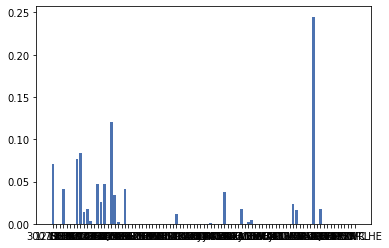

In [987]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [1011]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 128.6%
Annual volatility: 44.9%
Sharpe Ratio: 2.82


(1.2863397243320356, 0.4486007968456002, 2.822865525956445)

Comparing our ETF set with BATT, we can find that our expected annual return is 76.9%, much higher than the 10.78% for the BATT in the market. However, our annual volatility is much higher than the market BATT as 44.00% is much higher than 34.83%. And this is probably because of the extremal weights on two stocks within the entire portfolio for our ETF design whereas the market BATT ETF assign weights to 92 stocks. Overall, the Sharpe ratio at 1.7 indicates that our ETF performs better than natural BATT as it's only 0.3 for the market DIA.

Method 2: try to code without using package

In [1012]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df=df.dropna()

In [1013]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
# instantiate empty list containers for returns and sd
'''list_portfolio_returns = []
list_portfolio_sd = []
# For loop to simulate 5000 random weight vectors (numpy array objects)
for p in range(5000):
  # Return random floats in the half-open interval [0.0, 1.0)
  weights = np.random.random(size = len(df.columns)) 
  # Normalize to unity
  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object
  weights /= np.sum(weights) 
  # Lists are mutable so growing will not be memory inefficient
  list_portfolio_returns.append(portfolio_returns(weights))
  list_portfolio_sd.append(portfolio_sd(weights))
  # Convert list to numpy arrays
  port_returns = np.array(object = list_portfolio_returns)
  port_sd = np.array(object = list_portfolio_sd)
'''

'list_portfolio_returns = []\nlist_portfolio_sd = []\n# For loop to simulate 5000 random weight vectors (numpy array objects)\nfor p in range(5000):\n  # Return random floats in the half-open interval [0.0, 1.0)\n  weights = np.random.random(size = len(df.columns)) \n  # Normalize to unity\n  # The /= operator divides the array by the sum of the array and rebinds "weights" to the new object\n  weights /= np.sum(weights) \n  # Lists are mutable so growing will not be memory inefficient\n  list_portfolio_returns.append(portfolio_returns(weights))\n  list_portfolio_sd.append(portfolio_sd(weights))\n  # Convert list to numpy arrays\n  port_returns = np.array(object = list_portfolio_returns)\n  port_sd = np.array(object = list_portfolio_sd)\n'

In [923]:
# User defined Sharpe ratio function
# Negative sign to compute the negative value of Sharpe ratio
def sharpe_fun(weights):
  return - (portfolio_returns(weights) / portfolio_sd(weights))
# We use an anonymous lambda function
constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1},{'type': 'ineq', 'fun': lambda x: x})
# This creates 30 tuples of (0, 1), all of which exist within a container tuple
# We essentially create a sequence of (min, max) pairs
bounds = tuple((0, 1) for w in weights)
# Repeat the list with the value (1 / 30) 30 times, and convert list to array
equal_weights = np.array([1 / len(df.columns)] * len(df.columns))

In [237]:
# Minimization results
max_sharpe_results = sco.minimize(
  # Objective function
  fun = sharpe_fun, 
  # Initial guess, which is the equal weight array
  x0 = equal_weights, 
  method = 'SLSQP',
  bounds = bounds, 
  constraints = constraints
)

In [238]:
# Extract the weight composition array which maximize the Sharpe ratio
max_sharpe_results["x"]

array([5.57618730e-05, 6.91423349e-12, 0.00000000e+00, 1.30305259e-02,
       1.14684199e-11, 0.00000000e+00, 7.84434051e-11, 5.57618730e-05,
       5.57618730e-05, 0.00000000e+00, 2.57062492e-03, 9.64915018e-12,
       3.26885871e-10, 1.64468127e-11, 5.57618730e-05, 2.96929824e-02,
       5.57618730e-05, 2.63621411e-02, 5.57618730e-05, 5.57618730e-05,
       0.00000000e+00, 2.13849214e-11, 5.57618730e-05, 8.32213251e-12,
       2.48303422e-12, 1.12486548e-11, 0.00000000e+00, 1.96209803e-12,
       0.00000000e+00, 1.87121852e-11, 6.89518029e-11, 0.00000000e+00,
       5.57618730e-05, 0.00000000e+00, 4.54102638e-02, 5.57618730e-05,
       0.00000000e+00, 3.27855631e-11, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 3.24336102e-11, 0.00000000e+00, 8.51837650e-11,
       1.29454783e-02, 2.22214206e-11, 0.00000000e+00, 5.27723280e-11,
       5.96845661e-12, 0.00000000e+00, 1.39686077e-11, 6.88833499e-03,
       5.32763408e-11, 3.25862588e-01, 1.58821601e-11, 1.61244775e-11,
      

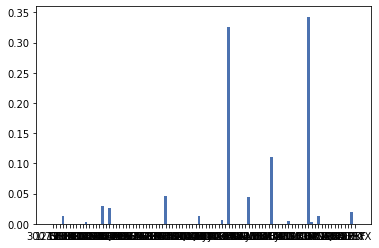

In [240]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,max_sharpe_results["x"], align='center')
plt.show() 

Method 3

In [ ]:
def sharpe_fun(weights,rf):
  return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))

In [ ]:
def portfolio_returnsn(weights):
    return -(np.sum(df.mean() * weights)) * 253

# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)
#from __future__ import (absolute_import, division,print_function, unicode_literals)
#from builtins import *

def mini_vol(target_ret):
    """number is stock numbers；ret_ave_vector is the return column vector;
       ret_cov_matrix is the return covariance matrix
       target_ret is target return
    """
    # reverse the covariance matrix
    
    cons = [{'type':'eq', 'fun': lambda x: portfolio_returns(x)-target_ret},
            {'type':'eq', 'fun': lambda x: np.sum(x) - 1},
           {'type': 'ineq', 'fun': lambda x: x}]
    bounds = tuple((0, 1) for w in weights)
    equal_weights = np.array([1 / len(df.columns)] * len(df.columns))
    # Minimization results
    weights2 = sco.minimize(
        # Objective function
        fun = portfolio_sd, 
        # Initial guess, which is the equal weight array
        x0 = equal_weights, 
        method = 'SLSQP',
        bounds = bounds, 
        constraints = cons)
    #print(weights2)
    return weights2

In [ ]:
def sharpe_fun(weights,rf):
    return ((portfolio_returns(weights)-rf) / portfolio_sd(weights))
port_ret = []
port_std = []
port_sr=[]

# plot the efficient frontier and create a dataframe for this
ranges = np.arange(0,1, 0.00001)
for i in ranges:
    weight = mini_vol(i)
    port_ret1= portfolio_returns(weight["x"])
    port_std1=portfolio_sd(weight["x"])
    #define rf
    rf=0.2
    port_sr1=sharpe_fun(weight["x"],rf)
    port_ret.append(port_ret1)
    port_std.append(port_std1)
    port_sr.append(port_sr1)

port_std = np.array(port_std)
port_ret = np.array(port_ret)
port_sr== np.array(port_sr)

In [ ]:
data = {'Returns':port_ret, 'Volatility':port_std, "Sharpe Ratio": port_sr}
portfolios=pd.DataFrame(data)
# Finding the optimal portfolio
# set risk free rate as 0.02
rf = 0.02 # risk factor
def evaluation(rf):
    return portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]

evaluation(rf)
#optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
#optimal_risky_port

In [ ]:
weight=mini_vol((((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()-1)*0.00001)
weight["x"]
#portfolio_returns(weight["x"])
#weight

In [ ]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(df.columns,weight["x"], align='center')
plt.show() 

In [305]:
len(df.columns)

89

In [1032]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253/12
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253/12) @ weights)

# Risk-Parity Portfolio

In [1014]:
ze=[0.12]
for i in range(88):
    ze.append(0.01)

In [1015]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=df.columns,
                start_date=datetime.datetime(2019,6,19),
                end_date=datetime.datetime(2022,6,19)):

    # We download the prices from Yahoo Finance
    prices = portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = ze 
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

300750.SZ     0.144883
1211.HK       0.002881
BHP           0.003913
TSLA          0.001471
GLEN.L        0.003493
LI            0.003454
NIO           0.000775
002812.SZ     0.038053
300014.SZ     0.038594
051910.KS     0.005489
1772.HK       0.002198
LCID          0.001090
XPEV          0.002087
603799.SS     0.039383
006400.KS     0.005716
002371.SZ     0.035094
SQM           0.002821
002709.SZ     0.039749
300450.SZ     0.037974
SEDG          0.002474
ALB           0.002818
603659.SS     0.038546
6752.T        0.003265
3993.HK       0.004177
PLUG          0.000684
S32.AX        0.010563
6762.T        0.003210
FM.TO         0.001784
CHPT          0.001536
6619.T        0.002265
6701.T        0.008233
5713.T        0.003584
UMI.BR        0.003759
MIN.AX        0.003919
HYLN          0.004987
361610.KS     0.035532
VAR1.DE       0.003751
IGO.AX        0.006229
LAC           0.001360
LUN.TO        0.002280
FCEL          0.000248
INCO.JK       0.003442
LTHM          0.001785
4004.T     

<BarContainer object of 89 artists>

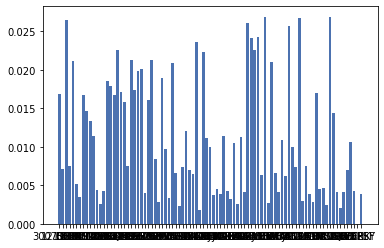

In [911]:
# plot the weights
plt.bar(df.columns,get_weights(), align='center')

# ETF Performance Evaluation

In [1033]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

-0.0909

In [1034]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.0952

In [1035]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

-0.9556

In [248]:
# consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

3.4732

Comparing our ETF set with BATT, we can find that our expected annual return is 122.74%, still higher than the 10.78% for the BATT in the market. In addition, our annual volatility is also lower than the market BATT as 34.44% is slightly lower than 34.83%. Overall, the Sharpe ratio at 3.5641 also indicates that our ETF performs better than natural BATT as it's only 0.30  for the market BATT.(Notice: even consider the risk-free rate, Sharpe ratio of 3.4732 is also higher than 0.30)

# Let's evaluuate the ETF with more than 100 stocks

# Evaluation of AIEQ

In [1239]:
# we plan to evaluate the 1-year data  (as there's stock that was introduced within 1 year agao)
start = datetime.datetime(2018,6,19)
end = datetime.datetime(2021,6,19)

# a function to read a single stock
def get_stock(ticker):
    data = web.DataReader(f"{ticker}","yahoo",start,end)
    data[f'{ticker}'] = data["Adj Close"]
    data = data[[f'{ticker}']] 
    print(data.head())
    return data 

from functools import reduce

# a function to read different stocks and combine them into a single table
def combine_stocks(tickers):
    data_frames = []
    for i in tickers:
        data_frames.append(get_stock(i))
        
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'], how='outer'), data_frames)
    print(df_merged.head())
    return df_merged

In [1240]:
# call the function and generate a table with stock adjusted close prices
stocks = ["AAPL", "BKNG", "DG","TMUS","KO","VLO","CMCSA","VEEV","FTNT","AMD","PATH","PSX","FDX","RBLX","ZM","MPC","VZ","EXAS","DHR","BEAM","UBER","NTLA","PD","PACB","DNA","XPEV","BEKE","ROKU","TWOU","AZO","SAFM","NVR","CHWY","CERS","MAR","U","CDEV","PSTG","F","MRTX","EPRT","HASI","CAT","IAA","RAMP","TWST","VCYT","ARCH","ITT","VICI","RETA","OXY","DDS","UAA","NHI","ZTS","BLDR","BLI","DOV","PBF","NOG","LW","GH","BKR","GOOGL","GSAT","SGFY","FATE","FND","CE","NFG","APD","OSK","ACI","PYPL","EL","DCPH","CRM","OKE","HCC","TWTR","SWTX","TEX","TXG","WING","GKOS","COUP","HCSG","ATGE","FLT","NRIX","OI","ARR","RGNX","MHR.F","TENB","UHS","SGMO","EXTR","NVDA","CHS","TSLA","EVRI","IART","KN","WWD","GME","AEP","SNEX","PINS","FN","CTVA","ONTO","COOP","SMP"]
portfolio=combine_stocks(stocks)
portfolio

                 AAPL
Date                 
2018-06-19  44.884731
2018-06-20  45.080524
2018-06-21  44.829140
2018-06-22  44.698605
2018-06-25  44.033878
                   BKNG
Date                   
2018-06-19  2139.260010
2018-06-20  2145.770020
2018-06-21  2122.489990
2018-06-22  2102.850098
2018-06-25  2050.520020
                   DG
Date                 
2018-06-19  93.856659
2018-06-20  94.415390
2018-06-21  95.060806
2018-06-22  96.476891
2018-06-25  96.765862
                 TMUS
Date                 
2018-06-19  60.540001
2018-06-20  60.340000
2018-06-21  60.000000
2018-06-22  60.790001
2018-06-25  59.730000
                   KO
Date                 
2018-06-19  38.971416
2018-06-20  38.667511
2018-06-21  38.515560
2018-06-22  38.658569
2018-06-25  38.953552
                  VLO
Date                 
2018-06-19  96.701286
2018-06-20  95.963303
2018-06-21  92.223602
2018-06-22  93.069389
2018-06-25  90.598373
                CMCSA
Date                 
2018-06-19  30.679

                  NHI
Date                 
2018-06-19  58.916397
2018-06-20  59.658142
2018-06-21  59.418858
2018-06-22  59.251366
2018-06-25  59.825623
                  ZTS
Date                 
2018-06-19  85.046333
2018-06-20  84.802666
2018-06-21  84.822144
2018-06-22  83.652473
2018-06-25  82.560738
                 BLDR
Date                 
2018-06-19  18.959999
2018-06-20  19.549999
2018-06-21  19.020000
2018-06-22  18.450001
2018-06-25  18.200001
                  BLI
Date                 
2020-07-17  65.449997
2020-07-20  62.099998
2020-07-21  58.500000
2020-07-22  56.000000
2020-07-23  58.099998
                  DOV
Date                 
2018-06-19  69.679123
2018-06-20  68.864647
2018-06-21  67.844231
2018-06-22  68.284233
2018-06-25  68.415306
                  PBF
Date                 
2018-06-19  44.238327
2018-06-20  42.966900
2018-06-21  41.358913
2018-06-22  41.564579
2018-06-25  39.797665
                  NOG
Date                 
2018-06-19  28.301226
2018-06-20

                 PINS
Date                 
2019-04-18  24.400000
2019-04-22  24.990000
2019-04-23  25.850000
2019-04-24  26.799999
2019-04-25  28.799999
                   FN
Date                 
2018-06-19  36.230000
2018-06-20  37.009998
2018-06-21  36.970001
2018-06-22  36.660000
2018-06-25  35.200001
                 CTVA
Date                 
2019-05-24  27.782021
2019-05-28  27.556889
2019-05-29  27.303020
2019-05-30  27.590422
2019-05-31  25.837276
                 ONTO
Date                 
2019-10-28  35.330002
2019-10-29  35.330002
2019-10-30  32.520000
2019-10-31  32.200001
2019-11-01  32.930000
                 COOP
Date                 
2018-06-19  15.480000
2018-06-20  16.080000
2018-06-21  15.720000
2018-06-22  16.200001
2018-06-25  15.840000
                  SMP
Date                 
2018-06-19  46.476036
2018-06-20  47.151100
2018-06-21  47.282356
2018-06-22  47.498005
2018-06-25  47.254234


/Users/beckybian/opt/anaconda3/lib/python3.7/site-packages/pandas/core/reshape/merge.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  return op.get_result()


                 AAPL         BKNG         DG       TMUS         KO  \
Date                                                                  
2018-06-19  44.884731  2139.260010  93.856659  60.540001  38.971416   
2018-06-20  45.080524  2145.770020  94.415390  60.340000  38.667511   
2018-06-21  44.829140  2122.489990  95.060806  60.000000  38.515560   
2018-06-22  44.698605  2102.850098  96.476891  60.790001  38.658569   
2018-06-25  44.033878  2050.520020  96.765862  59.730000  38.953552   

                  VLO      CMCSA       VEEV    FTNT        AMD  PATH  \
Date                                                                   
2018-06-19  96.701286  30.679590  83.169998  12.864  16.690001   NaN   
2018-06-20  95.963303  31.221928  84.529999  13.016  16.520000   NaN   
2018-06-21  92.223602  30.660887  83.559998  12.948  15.650000   NaN   
2018-06-22  93.069389  31.614655  82.839996  12.786  15.800000   NaN   
2018-06-25  90.598373  30.969456  78.750000  12.424  15.110000   NaN  

,AAPL,BKNG,DG,TMUS,KO,VLO,CMCSA,VEEV,FTNT,AMD,PATH,PSX,FDX,RBLX,ZM,MPC,VZ,EXAS,DHR,BEAM,UBER,NTLA,PD,PACB,DNA,XPEV,BEKE,ROKU,TWOU,AZO,SAFM,NVR,CHWY,CERS,MAR,U,CDEV,PSTG,F,MRTX,EPRT,HASI,CAT,IAA,RAMP,TWST,VCYT,ARCH,ITT,VICI,RETA,OXY,DDS,UAA,NHI,ZTS,BLDR,BLI,DOV,PBF,NOG,LW,GH,BKR,GOOGL,GSAT,SGFY,FATE,FND,CE,NFG,APD,OSK,ACI,PYPL,EL,DCPH,CRM,OKE,HCC,TWTR,SWTX,TEX,TXG,WING,GKOS,COUP,HCSG,ATGE,FLT,NRIX,OI,ARR,RGNX,MHR.F,TENB,UHS,SGMO,EXTR,NVDA,CHS,TSLA,EVRI,IART,KN,WWD,GME,AEP,SNEX,PINS,FN,CTVA,ONTO,COOP,SMP
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-19,44.884731,2139.260010,93.856659,60.540001,38.971416,96.701286,30.679590,83.169998,12.864000,16.690001,NaN,97.651886,245.790680,NaN,NaN,63.861103,41.201538,69.489998,98.369766,NaN,NaN,28.950001,NaN,3.840000,NaN,NaN,NaN,45.270000,94.309998,686.489990,102.324181,3099.000000,NaN,7.01,133.202942,NaN,17.299999,24.459999,10.330323,50.450001,NaN,15.843835,130.233475,NaN,30.030001,NaN,9.260000,75.786522,51.799553,16.889008,40.900002,73.167282,85.391632,22.620001,58.916397,85.046333,18.959999,NaN,69.679123,44.238327,28.301226,63.309910,NaN,28.919397,58.934502,0.49,NaN,12.310000,53.820000,103.466484,46.121124,146.555756,66.407898,NaN,84.519997,150.179916,43.959999,139.520004,52.258354,20.903337,44.950001,NaN,38.282478,NaN,45.553707,43.439999,62.990002,38.598106,48.900002,220.080002,NaN,16.945694,15.454829,60.549999,28.115360,NaN,113.419693,16.450001,8.69,64.545692,7.242802,70.510002,7.950000,66.620003,15.450000,75.992340,2.765323,58.518398,52.740002,NaN,36.230000,NaN,NaN,15.480000,46.476036
2018-06-20,45.080524,2145.770020,94.415390,60.340000,38.667511,95.963303,31.221928,84.529999,13.016000,16.520000,NaN,97.660400,239.170044,NaN,NaN,63.261219,40.853245,69.330002,97.494530,NaN,NaN,30.790001,NaN,3.910000,NaN,NaN,NaN,46.750000,94.480003,690.059998,103.137276,3099.919922,NaN,7.25,132.627502,NaN,17.650000,24.190001,10.312944,51.500000,NaN,15.826864,130.078995,NaN,30.330000,NaN,9.660000,76.683617,52.088932,17.126192,40.959999,73.752068,89.991058,23.110001,59.658142,84.802666,19.549999,NaN,68.864647,42.966900,27.212719,64.359062,NaN,29.201963,59.203499,0.52,NaN,13.480000,51.959999,103.272720,46.662598,144.746216,66.521667,NaN,85.949997,148.309937,44.369999,138.940002,53.230751,21.520840,46.130001,NaN,38.494625,NaN,45.327663,44.509998,64.320000,39.526085,49.200001,221.720001,NaN,16.779079,15.387572,66.800003,28.830078,NaN,114.730499,18.049999,8.74,65.076599,7.371525,72.444000,7.920000,66.680000,15.480000,76.841461,2.758300,58.544651,52.910000,NaN,37.009998,NaN,NaN,16.080000,47.151100
2018-06-21,44.829140,2122.489990,95.060806,60.000000,38.515560,92.223602,30.660887,83.559998,12.948000,15.650000,NaN,94.984329,234.689713,NaN,NaN,62.112892,41.311977,68.820000,96.284958,NaN,NaN,29.510000,NaN,3.920000,NaN,NaN,NaN,45.369999,90.050003,688.500000,97.900543,3065.510010,NaN,7.18,130.423370,NaN,17.280001,24.030001,10.173933,52.400002,11.568772,16.157827,126.807243,NaN,29.990000,NaN,9.610000,76.464119,51.027866,17.150730,39.360001,72.733131,90.604317,22.760000,59.418858,84.822144,19.020000,NaN,67.844231,41.358913,26.223166,64.177818,NaN,28.539684,58.472000,0.50,NaN,13.080000,50.430000,102.700630,45.928997,143.726608,65.260986,NaN,85.970001,147.147247,44.950001,137.880005,52.250771,20.953407,45.240002,NaN,38.340328,NaN,46.177612,40.650002,63.990002,39.397449,49.250000,218.820007,NaN,16.534060,15.421200,67.550003,28.811516,NaN,113.863190,16.129999,8.64,63.786522,7.508830,69.501999,7.640000,66.430000,15.310000,75.797150,2.726696,59.043468,52.389999,NaN,36.970001,NaN,NaN,15.720000,47.282356
2018-06-22,44.698605,2102.850098,96.476891,60.790001,38.658569,93.069389,31.614655,82.839996,12.786000,15.800000,NaN,95.470093,230.588593,NaN,NaN,62.232861,42.271927,66.330002,97.651886,NaN,NaN,28.910000,NaN,3.830000,NaN,NaN,NaN,44.709999,87.599998,685.979980,97.290718,3000.649902,NaN,7.03,129.331085,NaN,17.959999,23.820000,10.121801,51.349998,11.

In [1241]:
x=[]
for i in range(len(portfolio['DG'])):
    x.append(1.00)

In [1242]:
portfolio["FGXXX"]=np.array(x)
portfolio["ANTM"]=np.array(x)

/Users/beckybian/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  """Entry point for launching an IPython kernel.
/Users/beckybian/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  


# Mean-variance Portfolio

In [1243]:
# calculate the expected return using historical data
mu = mean_historical_return(portfolio, returns_data=False)
# calculate the covariance matrix
S = CovarianceShrinkage(portfolio).ledoit_wolf()

In [1244]:
from pypfopt.efficient_frontier import EfficientFrontier

# generate the efficient frontier
ef = EfficientFrontier(mu,S)

In [1245]:
# maximize sharpe ratio to help us get the portfolio weights
weights = ef.max_sharpe()
cleaned_weights = ef.clean_weights()
print(dict(cleaned_weights))

{'AAPL': 0.0, 'BKNG': 0.0, 'DG': 0.01141, 'TMUS': 0.02711, 'KO': 0.0, 'VLO': 0.0, 'CMCSA': 0.0, 'VEEV': 0.0, 'FTNT': 0.0, 'AMD': 0.0, 'PATH': 0.0, 'PSX': 0.0, 'FDX': 0.0, 'RBLX': 0.21035, 'ZM': 0.07418, 'MPC': 0.0, 'VZ': 0.02015, 'EXAS': 0.0, 'DHR': 0.0043, 'BEAM': 0.14935, 'UBER': 0.0, 'NTLA': 0.0, 'PD': 0.0, 'PACB': 0.0, 'DNA': 0.0, 'XPEV': 0.12999, 'BEKE': 0.0, 'ROKU': 0.0, 'TWOU': 0.0, 'AZO': 0.06425, 'SAFM': 0.0, 'NVR': 0.0, 'CHWY': 0.0, 'CERS': 0.0, 'MAR': 0.0, 'U': 0.03274, 'CDEV': 0.0, 'PSTG': 0.0, 'F': 0.0, 'MRTX': 0.0, 'EPRT': 0.0, 'HASI': 0.0, 'CAT': 0.0, 'IAA': 0.0, 'RAMP': 0.0, 'TWST': 0.0, 'VCYT': 0.0, 'ARCH': 0.0, 'ITT': 0.0, 'VICI': 0.0, 'RETA': 0.0, 'OXY': 0.0, 'DDS': 0.0, 'UAA': 0.0, 'NHI': 0.0, 'ZTS': 0.0, 'BLDR': 0.0, 'BLI': 0.0, 'DOV': 0.0, 'PBF': 0.0, 'NOG': 0.0, 'LW': 0.0, 'GH': 0.0, 'BKR': 0.0, 'GOOGL': 0.0, 'GSAT': 0.0, 'SGFY': 0.0, 'FATE': 0.0, 'FND': 0.0, 'CE': 0.0, 'NFG': 0.0, 'APD': 0.0, 'OSK': 0.0, 'ACI': 0.15701, 'PYPL': 0.0, 'EL': 0.0, 'DCPH': 0.0, 'CRM'

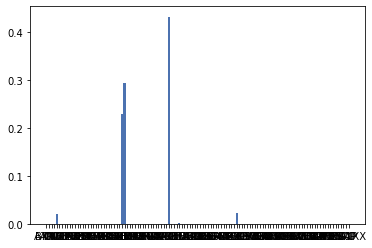

In [317]:
#import matplotlib.pyplot as plt
# plot the bar chart of the weights
plt.bar(dict(cleaned_weights).keys(),dict(cleaned_weights).values() , align='center')
plt.show() 

In [1246]:
# performance of the portfolio
ef.portfolio_performance(verbose=True)

Expected annual return: 89.0%
Annual volatility: 20.1%
Sharpe Ratio: 4.32


(0.8900216074326546, 0.20141120577214816, 4.319628613002247)

Comparing our ETF set with AIEQ, we can find that our expected annual return is 95.8%, much higher than the 7.22% for the AIEQ in the market. However, our annual volatility is much higher than the market AIEQ as 37.7% is much higher than 25.81%. And this is probably because of the extremal weights on two stocks within the entire portfolio for our ETF design whereas the market DIA ETF assign weights to 118 stocks. Overall, the Sharpe ratio at 2.49 indicates that our ETF performs better than natural DIA as it's only 0.26  for the market DIA.

In [1247]:
# Function for computing portfolio return
def portfolio_returns(weights):
    return (np.sum(df.mean() * weights)) * 253
# Function for computing standard deviation of portfolio returns
def portfolio_sd(weights):
    return np.sqrt(np.transpose(weights) @ (df.cov() * 253) @ weights)

# Risk-Parity Portfolio

In [1248]:
ze=[]
for i in range(17):
    ze.append(0)
for i in range(100):
    ze.append(0.01)
len(ze)

117

In [1128]:
len(portfolio.columns)

117

In [1249]:
# try to create a table of returns
df=pd.DataFrame(columns=portfolio.columns)
for i in df:
    df[i]=portfolio[i].pct_change()
df=df.dropna()

In [1250]:
from __future__ import division
import numpy as np
from matplotlib import pyplot as plt
from numpy.linalg import inv,pinv
from scipy.optimize import minimize
V = np.matrix(df.cov()) # covariance of assets
R = np.matrix(mean_historical_return(portfolio,returns_data=False)) # expected return


import pandas as pd
import pandas_datareader.data as web
import numpy as np
import datetime
from scipy.optimize import minimize
TOLERANCE = 1e-10


def _allocation_risk(weights, covariances):

    # We calculate the portfolio risk (sigma^2)
    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]  

    # It returns the risk of the weights distribution
    return portfolio_risk


def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    # We calculate the risk of the portfolio
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of total portfolio risk
    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T)/portfolio_risk

    # It returns the contribution of each asset to the risk of the weights
    # distribution
    return assets_risk_contribution


def _risk_budget_objective_error(weights, args):

    # The covariance matrix occupies the first position in the variable
    covariances = args[0]

    # The desired contribution of each asset to the portfolio risk occupies the
    # second position
    assets_risk_budget = args[1]

    # We convert the weights to a matrix
    weights = np.matrix(weights)

    # We calculate the portfolio risk (total portfolio variance)
    portfolio_risk = _allocation_risk(weights, covariances)

    # We calculate the contribution of each asset to the risk of the portfolio 
    assets_risk_contribution = _assets_risk_contribution_to_allocation_risk(weights, covariances)

    # We calculate the desired contribution of each asset to the risk of the portfolio
    assets_risk_target = np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    # Error between the desired contribution and the calculated/actual contribution of
    # each asset
    error = sum(np.square(assets_risk_contribution - assets_risk_target.T))[0, 0]

    # It returns the calculated error
    return error


def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    # Restrictions to consider in the optimisation: only long positions whose
    # sum equals 100%
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},
                   {'type': 'ineq', 'fun': lambda x: x})

    # Optimisation process in scipy
    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    # Recover the weights from the optimised object
    weights = optimize_result.x

    # It returns the optimised weights
    return weights


def get_weights(yahoo_tickers=portfolio.columns,
                start_date=datetime.datetime(2019,6,19),
                end_date=datetime.datetime(2022,6,19)):

    # We download the prices from Yahoo Finance
    prices = portfolio

    # We calculate the covariance matrix
    #covariances = 252.0 * prices.asfreq('W-FRI').pct_change().iloc[1:, :].cov().values
    covariances=V

    # The desired contribution of each asset to the portfolio risk: we want all
    # asset to contribute equally
    assets_risk_budget = [1 / prices.shape[1]] * prices.shape[1]

    # Initial weights: equally weighted
    #init_weights = [1 / prices.shape[1]] * prices.shape[1]
    init_weights = ze 
    # Optimisation process of weights
    weights =  _get_risk_parity_weights(covariances, assets_risk_budget, init_weights)

    # Convert the weights to a pandas Series
    weights = pd.Series(weights, index=prices.columns, name='weight')

    # It returns the optimised weights
    return weights
get_weights()

AAPL     0.004612
BKNG     0.005255
DG       0.002496
TMUS     0.004142
KO       0.002476
VLO      0.004400
CMCSA    0.003753
VEEV     0.004715
FTNT     0.004396
AMD      0.004616
PATH     0.004866
PSX      0.004211
FDX      0.004516
RBLX     0.005285
ZM       0.005376
MPC      0.004036
VZ       0.001322
EXAS     0.006404
DHR      0.012407
BEAM     0.004122
UBER     0.006998
NTLA     0.001446
PD       0.005864
PACB     0.001461
DNA      0.011857
XPEV     0.004095
BEKE     0.009458
ROKU     0.005138
TWOU     0.007885
AZO      0.011944
SAFM     0.012579
NVR      0.013026
CHWY     0.008036
CERS     0.009433
MAR      0.010497
U        0.006153
CDEV     0.002939
PSTG     0.007347
F        0.010961
MRTX     0.011881
EPRT     0.011724
HASI     0.009318
CAT      0.012621
IAA      0.011837
RAMP     0.010254
TWST     0.004748
VCYT     0.007720
ARCH     0.012376
ITT      0.013286
VICI     0.011905
RETA     0.009941
OXY      0.010513
DDS      0.001937
UAA      0.009081
NHI      0.012558
ZTS      0

<BarContainer object of 117 artists>

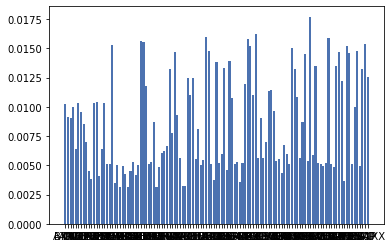

In [288]:
# plot the weights
plt.bar(df.columns,get_weights(), align='center')




In [1251]:
# Expected return
max_sharpe_port_return = portfolio_returns(get_weights())
round(max_sharpe_port_return, 4)

0.0742

In [1252]:
# Standard deviation
max_sharpe_port_sd = portfolio_sd(get_weights())
round(max_sharpe_port_sd, 4)

0.1196

In [1253]:
# Sharpe ratio
max_sharpe_port_sharpe = max_sharpe_port_return / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

0.6206

In [292]:
# consideration of risk-free rate
max_sharpe_port_sharpe = (max_sharpe_port_return-0.0313) / max_sharpe_port_sd
round(max_sharpe_port_sharpe, 4)

-0.1537

Comparing our ETF set with AIEQ, we can find that our expected annual return is -0.14%, lower than the 7.22% for the AIEQ in the market. In addition, our annual volatility is also lower than the market AIEQ as 21.28% is slightly lower than 25.81%. Overall, the Sharpe ratio at -0.0066 also indicates that our ETF performs worse than natural AIEQ as it's only 0.26 for the market AIEQ.(Notice: even consider the risk-free rate, Sharpe ratio of -0.1537 is also higher than 0.26)